# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

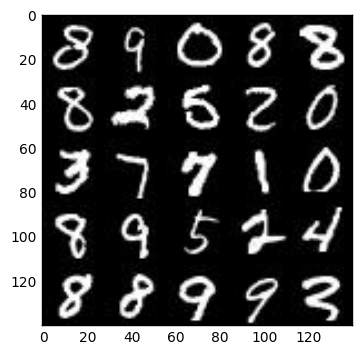

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

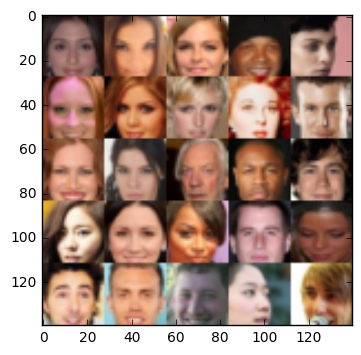

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1


/home/jesus/.local/lib/python3.5/site-packages/ipykernel/__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """

    real_inputs_placeholder = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real') 
    z_inputs_placeholder = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate_placeholder = tf.placeholder(tf.float32, shape=None)
    
    return real_inputs_placeholder, z_inputs_placeholder, learning_rate_placeholder
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        x4 = tf.layers.conv2d(relu3, 512, 5, strides=2, padding='same')
        bn4 = tf.layers.batch_normalization(x4, training=True)
        relu4 = tf.maximum(alpha * bn4, bn4)

        # Flatten it
        flat = tf.reshape(relu4, (-1, 2*2*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=(not is_train)):
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now

        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get the trainable_variables, split into G and D parts
    trainable_variables = tf.trainable_variables()
    generator_variables = [variable for variable in trainable_variables if variable.name.startswith('generator')]
    discriminator_variables = [variable for variable in trainable_variables if variable.name.startswith('discriminator')]

    discriminator_train_optimizer = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=discriminator_variables)
    generator_train_optimizer = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=generator_variables)
    
    return discriminator_train_optimizer, generator_train_optimizer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    print(data_shape)
    input_real, input_z, l_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    sample_z = np.random.uniform(-1, 1, size=(50, z_dim))
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    samples = []
    losses = []
    
    # training
    with tf.Session() as sess:        
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            i = 0
            for batch_images in get_batches(batch_size):
                i += 1
                # TODO: Train Model
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))            
                # run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z,l_rate: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z,l_rate: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z,l_rate: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z,l_rate: learning_rate})
                
                # for 100 batches show output
                if i % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)

                # print loss every epoch 
                train_loss_d = sess.run(d_loss, {input_z: batch_z, input_real: batch_images})
                train_loss_g = g_loss.eval({input_z: batch_z})
                if i % 10 == 0:
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))    
                    # save loss
                    losses.append((train_loss_d, train_loss_g))

                    # sample from generator 
                    gen_samples = sess.run(
                                   generator(input_z, data_shape[3], is_train=False),
                                   feed_dict={input_real: batch_images, input_z: sample_z,l_rate:learning_rate})
                    samples.append(gen_samples)
        show_generator_output(sess, 9, input_z, data_shape[3], data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

(60000, 28, 28, 1)
Epoch 1/2... Discriminator Loss: 4.6158... Generator Loss: 0.0131
Epoch 1/2... Discriminator Loss: 2.7297... Generator Loss: 0.1141
Epoch 1/2... Discriminator Loss: 1.3995... Generator Loss: 0.4990
Epoch 1/2... Discriminator Loss: 1.8135... Generator Loss: 0.2549
Epoch 1/2... Discriminator Loss: 1.9605... Generator Loss: 0.3573
Epoch 1/2... Discriminator Loss: 1.7431... Generator Loss: 0.5359
Epoch 1/2... Discriminator Loss: 1.5770... Generator Loss: 0.6392
Epoch 1/2... Discriminator Loss: 1.3714... Generator Loss: 0.9206
Epoch 1/2... Discriminator Loss: 1.7913... Generator Loss: 0.3574


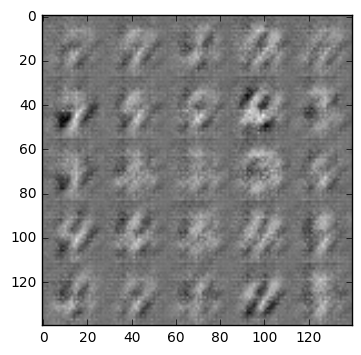

Epoch 1/2... Discriminator Loss: 1.4989... Generator Loss: 0.5835
Epoch 1/2... Discriminator Loss: 1.6664... Generator Loss: 0.5582
Epoch 1/2... Discriminator Loss: 1.4893... Generator Loss: 0.6548
Epoch 1/2... Discriminator Loss: 1.5600... Generator Loss: 0.6023
Epoch 1/2... Discriminator Loss: 1.5461... Generator Loss: 0.5012
Epoch 1/2... Discriminator Loss: 1.6037... Generator Loss: 0.8723
Epoch 1/2... Discriminator Loss: 1.3536... Generator Loss: 0.9027
Epoch 1/2... Discriminator Loss: 1.3943... Generator Loss: 0.5895
Epoch 1/2... Discriminator Loss: 1.4856... Generator Loss: 0.8031
Epoch 1/2... Discriminator Loss: 1.7182... Generator Loss: 0.2692


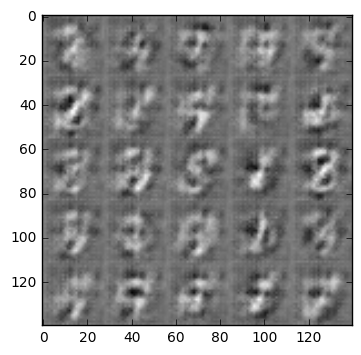

Epoch 1/2... Discriminator Loss: 1.3960... Generator Loss: 0.5574
Epoch 1/2... Discriminator Loss: 1.4672... Generator Loss: 0.4425
Epoch 1/2... Discriminator Loss: 1.7025... Generator Loss: 0.2881
Epoch 1/2... Discriminator Loss: 1.3202... Generator Loss: 1.4750
Epoch 1/2... Discriminator Loss: 1.3719... Generator Loss: 0.5609
Epoch 1/2... Discriminator Loss: 1.4891... Generator Loss: 0.6181
Epoch 1/2... Discriminator Loss: 1.4917... Generator Loss: 0.3706
Epoch 1/2... Discriminator Loss: 1.1383... Generator Loss: 0.6321
Epoch 1/2... Discriminator Loss: 1.3123... Generator Loss: 0.9671
Epoch 1/2... Discriminator Loss: 1.3455... Generator Loss: 0.5022


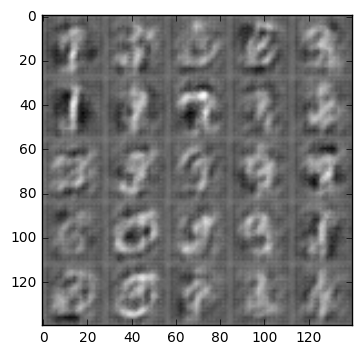

Epoch 1/2... Discriminator Loss: 1.5066... Generator Loss: 0.8555
Epoch 1/2... Discriminator Loss: 1.5655... Generator Loss: 0.4132
Epoch 1/2... Discriminator Loss: 1.6726... Generator Loss: 0.3093
Epoch 1/2... Discriminator Loss: 1.5937... Generator Loss: 0.3240
Epoch 1/2... Discriminator Loss: 1.3072... Generator Loss: 0.6812
Epoch 1/2... Discriminator Loss: 1.5393... Generator Loss: 0.3763
Epoch 1/2... Discriminator Loss: 1.6821... Generator Loss: 0.4943
Epoch 1/2... Discriminator Loss: 1.6231... Generator Loss: 0.3322
Epoch 1/2... Discriminator Loss: 1.5280... Generator Loss: 0.4855
Epoch 1/2... Discriminator Loss: 1.4004... Generator Loss: 0.4664


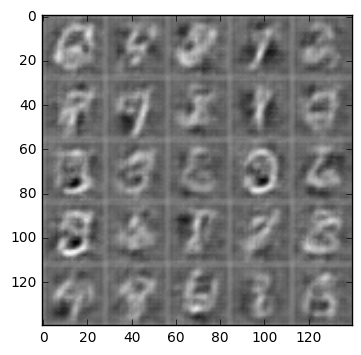

Epoch 1/2... Discriminator Loss: 1.7273... Generator Loss: 0.3272
Epoch 1/2... Discriminator Loss: 1.6913... Generator Loss: 0.3450
Epoch 1/2... Discriminator Loss: 1.4992... Generator Loss: 0.4472
Epoch 1/2... Discriminator Loss: 1.8903... Generator Loss: 0.2084
Epoch 1/2... Discriminator Loss: 1.9071... Generator Loss: 0.2146
Epoch 1/2... Discriminator Loss: 1.4609... Generator Loss: 0.6019
Epoch 1/2... Discriminator Loss: 1.5512... Generator Loss: 0.3462
Epoch 1/2... Discriminator Loss: 1.1015... Generator Loss: 0.8058
Epoch 1/2... Discriminator Loss: 1.9977... Generator Loss: 0.2245
Epoch 1/2... Discriminator Loss: 1.5862... Generator Loss: 0.4235


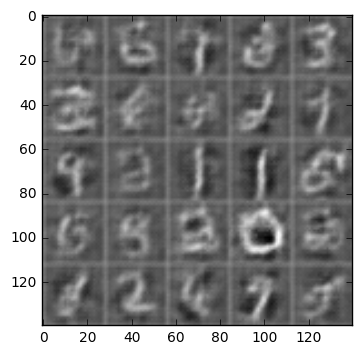

Epoch 1/2... Discriminator Loss: 1.6672... Generator Loss: 0.4212
Epoch 1/2... Discriminator Loss: 1.4312... Generator Loss: 0.5397
Epoch 1/2... Discriminator Loss: 1.4921... Generator Loss: 0.3991
Epoch 1/2... Discriminator Loss: 1.3617... Generator Loss: 0.5269
Epoch 1/2... Discriminator Loss: 2.2684... Generator Loss: 0.1394
Epoch 1/2... Discriminator Loss: 1.8581... Generator Loss: 0.2452
Epoch 1/2... Discriminator Loss: 1.7113... Generator Loss: 0.3064
Epoch 1/2... Discriminator Loss: 1.4381... Generator Loss: 0.4814
Epoch 1/2... Discriminator Loss: 1.8318... Generator Loss: 0.2189
Epoch 1/2... Discriminator Loss: 1.5737... Generator Loss: 0.3852


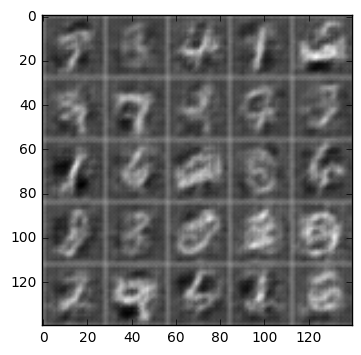

Epoch 1/2... Discriminator Loss: 2.0563... Generator Loss: 0.1699
Epoch 1/2... Discriminator Loss: 1.6805... Generator Loss: 0.2758
Epoch 1/2... Discriminator Loss: 1.5008... Generator Loss: 0.4760
Epoch 1/2... Discriminator Loss: 1.6387... Generator Loss: 0.3910
Epoch 1/2... Discriminator Loss: 2.2907... Generator Loss: 0.1359
Epoch 1/2... Discriminator Loss: 1.8406... Generator Loss: 0.2140
Epoch 1/2... Discriminator Loss: 1.3133... Generator Loss: 0.4347
Epoch 1/2... Discriminator Loss: 1.5599... Generator Loss: 0.3895
Epoch 1/2... Discriminator Loss: 1.9888... Generator Loss: 0.1895
Epoch 1/2... Discriminator Loss: 2.1990... Generator Loss: 0.1475


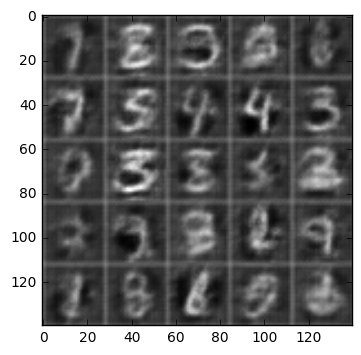

Epoch 1/2... Discriminator Loss: 1.7429... Generator Loss: 0.2753
Epoch 1/2... Discriminator Loss: 1.5160... Generator Loss: 0.4275
Epoch 1/2... Discriminator Loss: 1.5401... Generator Loss: 0.3702
Epoch 1/2... Discriminator Loss: 2.0384... Generator Loss: 0.2060
Epoch 1/2... Discriminator Loss: 1.9124... Generator Loss: 0.2114
Epoch 1/2... Discriminator Loss: 2.1076... Generator Loss: 0.1724
Epoch 1/2... Discriminator Loss: 1.5578... Generator Loss: 0.4508
Epoch 1/2... Discriminator Loss: 1.4872... Generator Loss: 0.3868
Epoch 1/2... Discriminator Loss: 1.9922... Generator Loss: 0.1779
Epoch 1/2... Discriminator Loss: 1.6517... Generator Loss: 0.3798


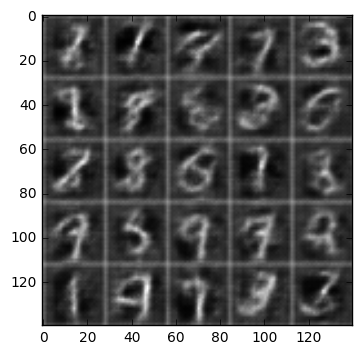

Epoch 1/2... Discriminator Loss: 2.1192... Generator Loss: 0.1569
Epoch 1/2... Discriminator Loss: 2.1503... Generator Loss: 0.1576
Epoch 1/2... Discriminator Loss: 1.9728... Generator Loss: 0.2006
Epoch 1/2... Discriminator Loss: 2.0894... Generator Loss: 0.1982
Epoch 1/2... Discriminator Loss: 2.2803... Generator Loss: 0.1437
Epoch 1/2... Discriminator Loss: 2.8271... Generator Loss: 0.0933
Epoch 1/2... Discriminator Loss: 2.2046... Generator Loss: 0.1544
Epoch 1/2... Discriminator Loss: 1.8857... Generator Loss: 0.2290
Epoch 1/2... Discriminator Loss: 1.0582... Generator Loss: 0.7062
Epoch 1/2... Discriminator Loss: 1.4273... Generator Loss: 1.1628


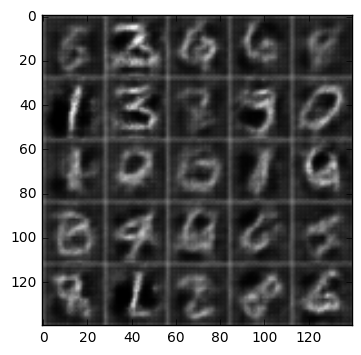

Epoch 1/2... Discriminator Loss: 1.3591... Generator Loss: 0.5832
Epoch 1/2... Discriminator Loss: 1.7171... Generator Loss: 0.3342
Epoch 1/2... Discriminator Loss: 1.7715... Generator Loss: 0.2506
Epoch 1/2... Discriminator Loss: 2.0802... Generator Loss: 0.1682
Epoch 1/2... Discriminator Loss: 2.1481... Generator Loss: 0.2039
Epoch 1/2... Discriminator Loss: 1.9626... Generator Loss: 0.4020
Epoch 1/2... Discriminator Loss: 2.2131... Generator Loss: 0.1366
Epoch 1/2... Discriminator Loss: 1.7944... Generator Loss: 0.2405
Epoch 1/2... Discriminator Loss: 2.5675... Generator Loss: 0.0940
Epoch 1/2... Discriminator Loss: 3.7676... Generator Loss: 2.8715


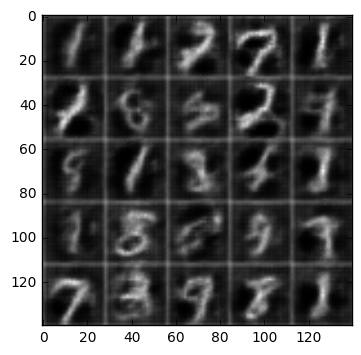

Epoch 1/2... Discriminator Loss: 1.1544... Generator Loss: 0.5134
Epoch 1/2... Discriminator Loss: 1.6163... Generator Loss: 0.2910
Epoch 1/2... Discriminator Loss: 1.5010... Generator Loss: 1.2379
Epoch 1/2... Discriminator Loss: 1.2958... Generator Loss: 0.7116
Epoch 1/2... Discriminator Loss: 1.3477... Generator Loss: 0.5429
Epoch 1/2... Discriminator Loss: 1.1987... Generator Loss: 0.5183
Epoch 1/2... Discriminator Loss: 1.9991... Generator Loss: 0.1957
Epoch 1/2... Discriminator Loss: 2.0194... Generator Loss: 0.2089
Epoch 1/2... Discriminator Loss: 1.6485... Generator Loss: 0.3130
Epoch 1/2... Discriminator Loss: 2.1354... Generator Loss: 0.1476


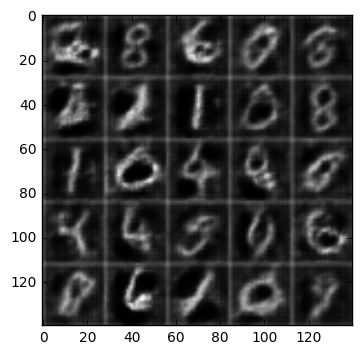

Epoch 1/2... Discriminator Loss: 1.4740... Generator Loss: 0.7060
Epoch 1/2... Discriminator Loss: 2.3642... Generator Loss: 0.1225
Epoch 1/2... Discriminator Loss: 1.9725... Generator Loss: 0.1844
Epoch 1/2... Discriminator Loss: 1.3205... Generator Loss: 0.5587
Epoch 1/2... Discriminator Loss: 2.4958... Generator Loss: 0.1097
Epoch 1/2... Discriminator Loss: 1.5191... Generator Loss: 0.3583
Epoch 1/2... Discriminator Loss: 1.8606... Generator Loss: 0.2255
Epoch 1/2... Discriminator Loss: 2.4955... Generator Loss: 0.1157
Epoch 1/2... Discriminator Loss: 1.7606... Generator Loss: 0.3027
Epoch 1/2... Discriminator Loss: 2.9202... Generator Loss: 0.0802


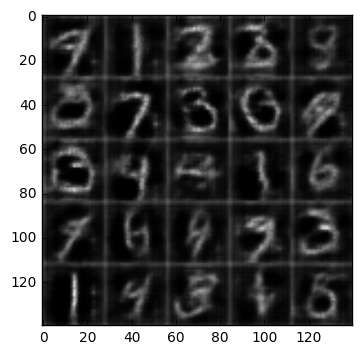

Epoch 1/2... Discriminator Loss: 1.1663... Generator Loss: 0.4930
Epoch 1/2... Discriminator Loss: 1.9941... Generator Loss: 0.1906
Epoch 1/2... Discriminator Loss: 1.6002... Generator Loss: 0.2785
Epoch 1/2... Discriminator Loss: 1.9926... Generator Loss: 0.2146
Epoch 1/2... Discriminator Loss: 2.0936... Generator Loss: 0.1853
Epoch 1/2... Discriminator Loss: 1.8810... Generator Loss: 0.2356
Epoch 1/2... Discriminator Loss: 2.2412... Generator Loss: 0.1428
Epoch 1/2... Discriminator Loss: 1.9653... Generator Loss: 0.2383
Epoch 1/2... Discriminator Loss: 1.8406... Generator Loss: 0.3193
Epoch 1/2... Discriminator Loss: 1.6179... Generator Loss: 0.4495


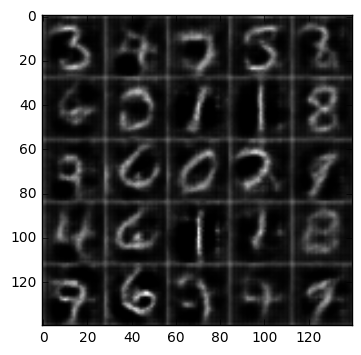

Epoch 1/2... Discriminator Loss: 2.2672... Generator Loss: 0.1584
Epoch 1/2... Discriminator Loss: 1.1681... Generator Loss: 0.5137
Epoch 1/2... Discriminator Loss: 1.6809... Generator Loss: 0.2992
Epoch 1/2... Discriminator Loss: 1.6991... Generator Loss: 1.8080
Epoch 1/2... Discriminator Loss: 2.2816... Generator Loss: 0.1532
Epoch 1/2... Discriminator Loss: 2.1564... Generator Loss: 0.1564
Epoch 1/2... Discriminator Loss: 2.6111... Generator Loss: 0.0920
Epoch 1/2... Discriminator Loss: 1.6985... Generator Loss: 0.2772
Epoch 1/2... Discriminator Loss: 2.1403... Generator Loss: 0.1544
Epoch 1/2... Discriminator Loss: 2.0190... Generator Loss: 0.1993


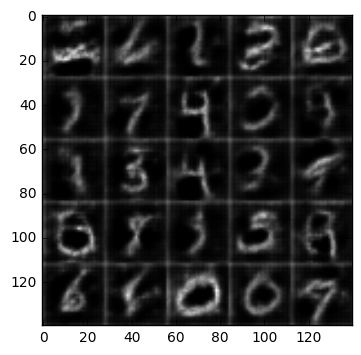

Epoch 1/2... Discriminator Loss: 3.4900... Generator Loss: 0.0545
Epoch 1/2... Discriminator Loss: 1.8247... Generator Loss: 0.2590
Epoch 1/2... Discriminator Loss: 2.2230... Generator Loss: 0.1636
Epoch 1/2... Discriminator Loss: 1.2101... Generator Loss: 0.4259
Epoch 1/2... Discriminator Loss: 1.7201... Generator Loss: 0.3274
Epoch 1/2... Discriminator Loss: 3.6294... Generator Loss: 0.0727
Epoch 1/2... Discriminator Loss: 1.9509... Generator Loss: 0.1991
Epoch 1/2... Discriminator Loss: 2.1710... Generator Loss: 0.1948
Epoch 1/2... Discriminator Loss: 1.1030... Generator Loss: 0.7988
Epoch 1/2... Discriminator Loss: 2.4952... Generator Loss: 0.1050


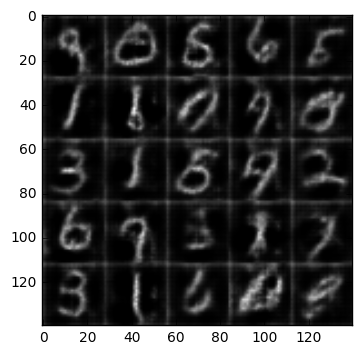

Epoch 1/2... Discriminator Loss: 1.2116... Generator Loss: 0.4546
Epoch 1/2... Discriminator Loss: 1.7720... Generator Loss: 0.2577
Epoch 1/2... Discriminator Loss: 1.6777... Generator Loss: 0.3521
Epoch 1/2... Discriminator Loss: 1.7041... Generator Loss: 0.2755
Epoch 1/2... Discriminator Loss: 0.8725... Generator Loss: 1.1103
Epoch 1/2... Discriminator Loss: 2.0352... Generator Loss: 0.2035
Epoch 1/2... Discriminator Loss: 2.3878... Generator Loss: 0.1406
Epoch 1/2... Discriminator Loss: 2.0513... Generator Loss: 0.2302
Epoch 1/2... Discriminator Loss: 1.7560... Generator Loss: 0.5043
Epoch 1/2... Discriminator Loss: 1.6572... Generator Loss: 0.3441


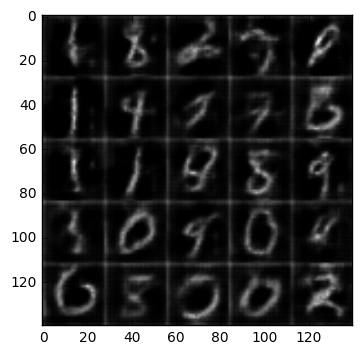

Epoch 1/2... Discriminator Loss: 2.5077... Generator Loss: 0.1315
Epoch 1/2... Discriminator Loss: 2.1709... Generator Loss: 0.1548
Epoch 1/2... Discriminator Loss: 2.5658... Generator Loss: 0.1239
Epoch 1/2... Discriminator Loss: 2.6086... Generator Loss: 0.1195
Epoch 1/2... Discriminator Loss: 3.0460... Generator Loss: 0.0630
Epoch 1/2... Discriminator Loss: 1.8803... Generator Loss: 1.1911
Epoch 1/2... Discriminator Loss: 1.0383... Generator Loss: 0.6243
Epoch 1/2... Discriminator Loss: 1.9951... Generator Loss: 0.1939
Epoch 1/2... Discriminator Loss: 2.1939... Generator Loss: 0.1684
Epoch 1/2... Discriminator Loss: 2.5769... Generator Loss: 0.1142


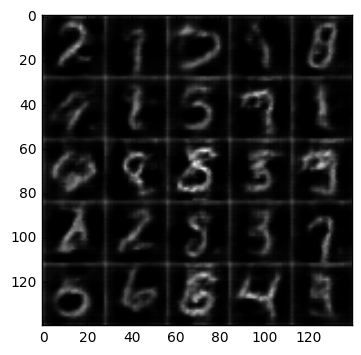

Epoch 1/2... Discriminator Loss: 2.5307... Generator Loss: 0.1190
Epoch 1/2... Discriminator Loss: 1.1148... Generator Loss: 0.5073
Epoch 1/2... Discriminator Loss: 2.0576... Generator Loss: 0.1961
Epoch 1/2... Discriminator Loss: 1.3283... Generator Loss: 0.4246
Epoch 1/2... Discriminator Loss: 2.0755... Generator Loss: 0.1763
Epoch 1/2... Discriminator Loss: 2.5064... Generator Loss: 0.1040
Epoch 1/2... Discriminator Loss: 1.7317... Generator Loss: 0.2940
Epoch 1/2... Discriminator Loss: 1.4235... Generator Loss: 0.4777
Epoch 1/2... Discriminator Loss: 2.0376... Generator Loss: 0.2028
Epoch 1/2... Discriminator Loss: 1.5396... Generator Loss: 0.2952


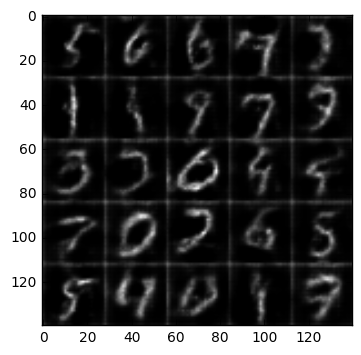

Epoch 1/2... Discriminator Loss: 2.0906... Generator Loss: 0.1837
Epoch 1/2... Discriminator Loss: 2.4614... Generator Loss: 0.1101
Epoch 1/2... Discriminator Loss: 1.5698... Generator Loss: 0.3546
Epoch 1/2... Discriminator Loss: 3.0462... Generator Loss: 0.0668
Epoch 1/2... Discriminator Loss: 2.0966... Generator Loss: 0.2051
Epoch 1/2... Discriminator Loss: 4.1620... Generator Loss: 5.0151
Epoch 1/2... Discriminator Loss: 1.3377... Generator Loss: 0.3966
Epoch 1/2... Discriminator Loss: 2.1404... Generator Loss: 0.2096
Epoch 2/2... Discriminator Loss: 2.6089... Generator Loss: 0.0897
Epoch 2/2... Discriminator Loss: 2.1686... Generator Loss: 0.1470
Epoch 2/2... Discriminator Loss: 2.3028... Generator Loss: 0.1451
Epoch 2/2... Discriminator Loss: 2.3324... Generator Loss: 0.1305
Epoch 2/2... Discriminator Loss: 2.1968... Generator Loss: 0.1896
Epoch 2/2... Discriminator Loss: 4.1170... Generator Loss: 0.0327
Epoch 2/2... Discriminator Loss: 1.2306... Generator Loss: 0.7242
Epoch 2/2.

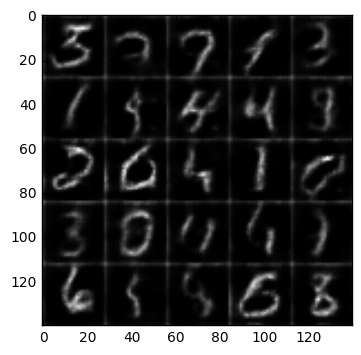

Epoch 2/2... Discriminator Loss: 1.4930... Generator Loss: 0.3306
Epoch 2/2... Discriminator Loss: 2.2103... Generator Loss: 0.1463
Epoch 2/2... Discriminator Loss: 2.0833... Generator Loss: 0.1807
Epoch 2/2... Discriminator Loss: 3.2765... Generator Loss: 0.0566
Epoch 2/2... Discriminator Loss: 2.5159... Generator Loss: 0.1165
Epoch 2/2... Discriminator Loss: 0.9862... Generator Loss: 0.6694
Epoch 2/2... Discriminator Loss: 2.3861... Generator Loss: 0.1366
Epoch 2/2... Discriminator Loss: 1.4574... Generator Loss: 0.4683
Epoch 2/2... Discriminator Loss: 2.1543... Generator Loss: 0.1859
Epoch 2/2... Discriminator Loss: 2.6457... Generator Loss: 0.1063


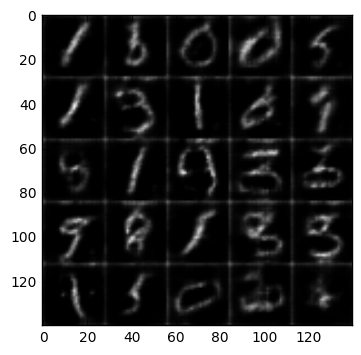

Epoch 2/2... Discriminator Loss: 2.1113... Generator Loss: 0.2384
Epoch 2/2... Discriminator Loss: 2.5099... Generator Loss: 0.1182
Epoch 2/2... Discriminator Loss: 1.0048... Generator Loss: 0.7460
Epoch 2/2... Discriminator Loss: 2.1080... Generator Loss: 2.1485
Epoch 2/2... Discriminator Loss: 3.1825... Generator Loss: 0.0613
Epoch 2/2... Discriminator Loss: 0.4786... Generator Loss: 1.9757
Epoch 2/2... Discriminator Loss: 1.5959... Generator Loss: 0.4228
Epoch 2/2... Discriminator Loss: 1.4961... Generator Loss: 0.3446
Epoch 2/2... Discriminator Loss: 2.2975... Generator Loss: 0.1469
Epoch 2/2... Discriminator Loss: 2.6704... Generator Loss: 0.0865


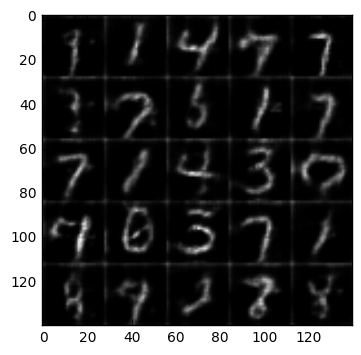

Epoch 2/2... Discriminator Loss: 2.6336... Generator Loss: 0.0989
Epoch 2/2... Discriminator Loss: 0.7445... Generator Loss: 0.9331
Epoch 2/2... Discriminator Loss: 1.9474... Generator Loss: 0.1980
Epoch 2/2... Discriminator Loss: 1.8022... Generator Loss: 0.2964
Epoch 2/2... Discriminator Loss: 1.7917... Generator Loss: 0.2402
Epoch 2/2... Discriminator Loss: 2.0944... Generator Loss: 0.2052
Epoch 2/2... Discriminator Loss: 2.2254... Generator Loss: 0.1495
Epoch 2/2... Discriminator Loss: 3.2543... Generator Loss: 0.0526
Epoch 2/2... Discriminator Loss: 2.9937... Generator Loss: 0.0676
Epoch 2/2... Discriminator Loss: 1.5578... Generator Loss: 0.3405


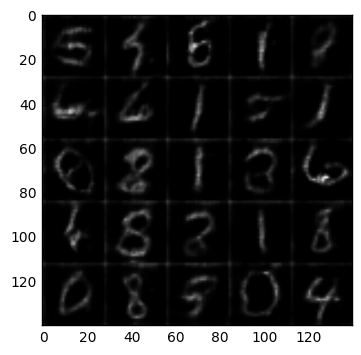

Epoch 2/2... Discriminator Loss: 2.2345... Generator Loss: 0.1636
Epoch 2/2... Discriminator Loss: 2.7571... Generator Loss: 0.0869
Epoch 2/2... Discriminator Loss: 1.7525... Generator Loss: 0.2773
Epoch 2/2... Discriminator Loss: 4.5281... Generator Loss: 0.0238
Epoch 2/2... Discriminator Loss: 1.7358... Generator Loss: 0.2960
Epoch 2/2... Discriminator Loss: 2.4108... Generator Loss: 0.2684
Epoch 2/2... Discriminator Loss: 2.2768... Generator Loss: 0.1366
Epoch 2/2... Discriminator Loss: 1.9677... Generator Loss: 0.2130
Epoch 2/2... Discriminator Loss: 2.7963... Generator Loss: 0.0977
Epoch 2/2... Discriminator Loss: 2.1401... Generator Loss: 0.1912


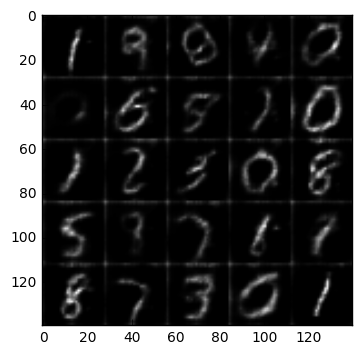

Epoch 2/2... Discriminator Loss: 1.4956... Generator Loss: 0.3684
Epoch 2/2... Discriminator Loss: 4.2953... Generator Loss: 0.0230
Epoch 2/2... Discriminator Loss: 2.1230... Generator Loss: 0.1583
Epoch 2/2... Discriminator Loss: 2.1976... Generator Loss: 0.1570
Epoch 2/2... Discriminator Loss: 3.2029... Generator Loss: 0.0534
Epoch 2/2... Discriminator Loss: 1.8506... Generator Loss: 0.2207
Epoch 2/2... Discriminator Loss: 1.3837... Generator Loss: 0.5851
Epoch 2/2... Discriminator Loss: 2.0685... Generator Loss: 0.2100
Epoch 2/2... Discriminator Loss: 2.3358... Generator Loss: 0.1432
Epoch 2/2... Discriminator Loss: 2.3498... Generator Loss: 0.1673


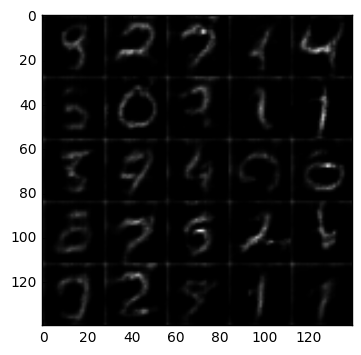

Epoch 2/2... Discriminator Loss: 1.8920... Generator Loss: 0.2386
Epoch 2/2... Discriminator Loss: 3.2738... Generator Loss: 0.0533
Epoch 2/2... Discriminator Loss: 2.3017... Generator Loss: 0.1493
Epoch 2/2... Discriminator Loss: 2.1679... Generator Loss: 0.1592
Epoch 2/2... Discriminator Loss: 2.5486... Generator Loss: 0.1186
Epoch 2/2... Discriminator Loss: 1.9785... Generator Loss: 0.2118
Epoch 2/2... Discriminator Loss: 2.0944... Generator Loss: 0.1942
Epoch 2/2... Discriminator Loss: 1.7120... Generator Loss: 0.3716
Epoch 2/2... Discriminator Loss: 1.9789... Generator Loss: 0.1972
Epoch 2/2... Discriminator Loss: 2.0994... Generator Loss: 0.1643


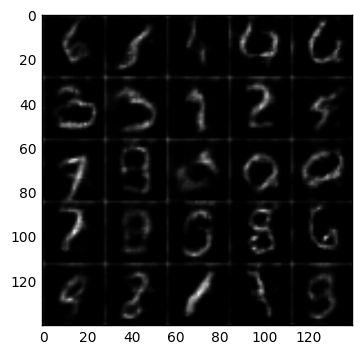

Epoch 2/2... Discriminator Loss: 2.1131... Generator Loss: 0.1671
Epoch 2/2... Discriminator Loss: 2.4526... Generator Loss: 0.1222
Epoch 2/2... Discriminator Loss: 1.4882... Generator Loss: 0.3909
Epoch 2/2... Discriminator Loss: 2.9459... Generator Loss: 0.1161
Epoch 2/2... Discriminator Loss: 1.9993... Generator Loss: 0.2002
Epoch 2/2... Discriminator Loss: 1.5345... Generator Loss: 0.3159
Epoch 2/2... Discriminator Loss: 1.3739... Generator Loss: 0.3971
Epoch 2/2... Discriminator Loss: 2.1771... Generator Loss: 2.1276
Epoch 2/2... Discriminator Loss: 1.9286... Generator Loss: 0.1929
Epoch 2/2... Discriminator Loss: 3.0764... Generator Loss: 0.0647


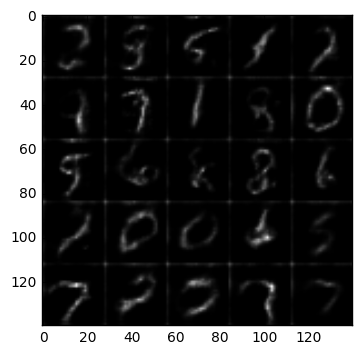

Epoch 2/2... Discriminator Loss: 2.2129... Generator Loss: 0.1592
Epoch 2/2... Discriminator Loss: 2.8538... Generator Loss: 0.0785
Epoch 2/2... Discriminator Loss: 0.6416... Generator Loss: 1.1189
Epoch 2/2... Discriminator Loss: 2.0582... Generator Loss: 0.2005
Epoch 2/2... Discriminator Loss: 2.3128... Generator Loss: 0.1391
Epoch 2/2... Discriminator Loss: 3.1056... Generator Loss: 0.0656
Epoch 2/2... Discriminator Loss: 3.0978... Generator Loss: 0.0760
Epoch 2/2... Discriminator Loss: 1.9654... Generator Loss: 0.2454
Epoch 2/2... Discriminator Loss: 2.6388... Generator Loss: 0.0940
Epoch 2/2... Discriminator Loss: 2.1249... Generator Loss: 0.1787


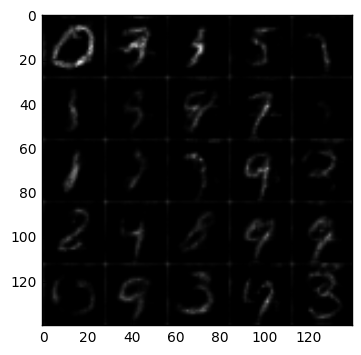

Epoch 2/2... Discriminator Loss: 2.4935... Generator Loss: 0.1165
Epoch 2/2... Discriminator Loss: 2.1688... Generator Loss: 0.2053
Epoch 2/2... Discriminator Loss: 1.3585... Generator Loss: 0.4745
Epoch 2/2... Discriminator Loss: 1.4669... Generator Loss: 0.3893
Epoch 2/2... Discriminator Loss: 4.2408... Generator Loss: 0.0245
Epoch 2/2... Discriminator Loss: 1.8645... Generator Loss: 0.2288
Epoch 2/2... Discriminator Loss: 2.9085... Generator Loss: 0.0848
Epoch 2/2... Discriminator Loss: 2.8574... Generator Loss: 0.0752
Epoch 2/2... Discriminator Loss: 3.3144... Generator Loss: 0.0873
Epoch 2/2... Discriminator Loss: 2.2124... Generator Loss: 0.1670


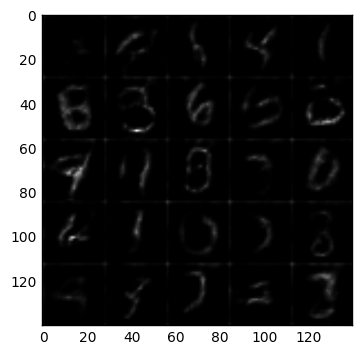

Epoch 2/2... Discriminator Loss: 1.6497... Generator Loss: 0.2934
Epoch 2/2... Discriminator Loss: 2.6306... Generator Loss: 0.0851
Epoch 2/2... Discriminator Loss: 2.0362... Generator Loss: 0.2162
Epoch 2/2... Discriminator Loss: 1.9152... Generator Loss: 0.2537
Epoch 2/2... Discriminator Loss: 1.9272... Generator Loss: 0.1867
Epoch 2/2... Discriminator Loss: 2.2581... Generator Loss: 0.1670
Epoch 2/2... Discriminator Loss: 3.0086... Generator Loss: 0.0642
Epoch 2/2... Discriminator Loss: 2.6017... Generator Loss: 0.1061
Epoch 2/2... Discriminator Loss: 2.9868... Generator Loss: 0.0776
Epoch 2/2... Discriminator Loss: 2.6794... Generator Loss: 0.0913


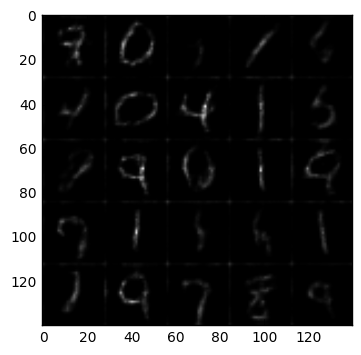

Epoch 2/2... Discriminator Loss: 1.5370... Generator Loss: 0.3221
Epoch 2/2... Discriminator Loss: 3.0614... Generator Loss: 0.0685
Epoch 2/2... Discriminator Loss: 2.9335... Generator Loss: 0.0708
Epoch 2/2... Discriminator Loss: 2.2736... Generator Loss: 0.1315
Epoch 2/2... Discriminator Loss: 2.1472... Generator Loss: 0.1887
Epoch 2/2... Discriminator Loss: 1.9736... Generator Loss: 0.2073
Epoch 2/2... Discriminator Loss: 1.6221... Generator Loss: 0.3003
Epoch 2/2... Discriminator Loss: 3.1365... Generator Loss: 0.0776
Epoch 2/2... Discriminator Loss: 1.7927... Generator Loss: 0.2659
Epoch 2/2... Discriminator Loss: 2.6041... Generator Loss: 0.0988


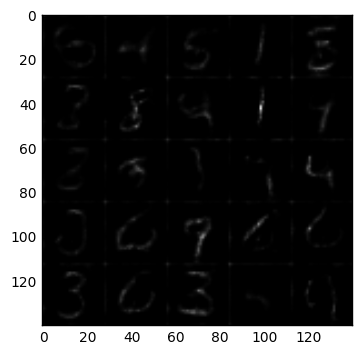

Epoch 2/2... Discriminator Loss: 1.5151... Generator Loss: 0.3059
Epoch 2/2... Discriminator Loss: 1.0437... Generator Loss: 0.6140
Epoch 2/2... Discriminator Loss: 1.1396... Generator Loss: 0.4716
Epoch 2/2... Discriminator Loss: 2.3018... Generator Loss: 0.1656
Epoch 2/2... Discriminator Loss: 2.5610... Generator Loss: 0.1099
Epoch 2/2... Discriminator Loss: 1.0042... Generator Loss: 0.7264
Epoch 2/2... Discriminator Loss: 1.4753... Generator Loss: 0.4540
Epoch 2/2... Discriminator Loss: 3.2448... Generator Loss: 0.0544
Epoch 2/2... Discriminator Loss: 2.6648... Generator Loss: 0.1473
Epoch 2/2... Discriminator Loss: 2.2465... Generator Loss: 0.1416


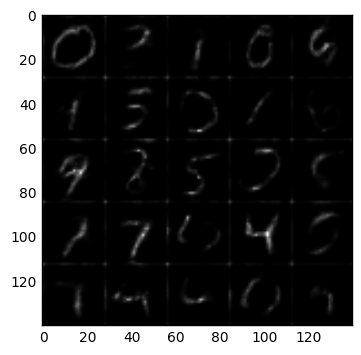

Epoch 2/2... Discriminator Loss: 2.1435... Generator Loss: 0.1619
Epoch 2/2... Discriminator Loss: 0.9843... Generator Loss: 0.7374
Epoch 2/2... Discriminator Loss: 2.9348... Generator Loss: 0.0755
Epoch 2/2... Discriminator Loss: 2.0801... Generator Loss: 0.2085
Epoch 2/2... Discriminator Loss: 2.8850... Generator Loss: 0.0976
Epoch 2/2... Discriminator Loss: 1.0097... Generator Loss: 0.7113
Epoch 2/2... Discriminator Loss: 2.7731... Generator Loss: 0.1520
Epoch 2/2... Discriminator Loss: 1.5618... Generator Loss: 0.5296
Epoch 2/2... Discriminator Loss: 2.3336... Generator Loss: 0.1464
Epoch 2/2... Discriminator Loss: 1.4537... Generator Loss: 0.3790


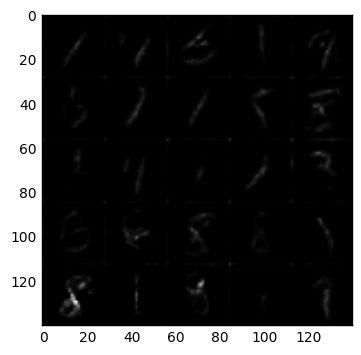

Epoch 2/2... Discriminator Loss: 2.4745... Generator Loss: 0.1092
Epoch 2/2... Discriminator Loss: 0.8881... Generator Loss: 1.0671
Epoch 2/2... Discriminator Loss: 3.0968... Generator Loss: 0.0829
Epoch 2/2... Discriminator Loss: 2.8268... Generator Loss: 0.0864
Epoch 2/2... Discriminator Loss: 3.0401... Generator Loss: 0.0640
Epoch 2/2... Discriminator Loss: 5.5604... Generator Loss: 0.0112
Epoch 2/2... Discriminator Loss: 1.8921... Generator Loss: 0.2311
Epoch 2/2... Discriminator Loss: 1.7186... Generator Loss: 0.3192
Epoch 2/2... Discriminator Loss: 1.8157... Generator Loss: 0.3464
Epoch 2/2... Discriminator Loss: 2.9705... Generator Loss: 0.0725


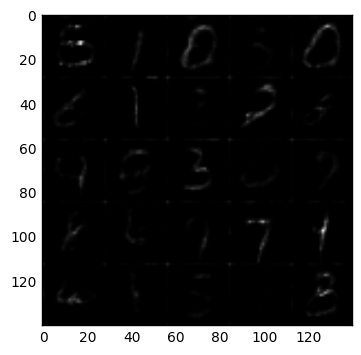

Epoch 2/2... Discriminator Loss: 2.3697... Generator Loss: 0.1363
Epoch 2/2... Discriminator Loss: 2.4456... Generator Loss: 0.1308
Epoch 2/2... Discriminator Loss: 3.3205... Generator Loss: 0.0622
Epoch 2/2... Discriminator Loss: 2.5336... Generator Loss: 0.1388
Epoch 2/2... Discriminator Loss: 2.7581... Generator Loss: 0.0840
Epoch 2/2... Discriminator Loss: 1.4062... Generator Loss: 0.3403
Epoch 2/2... Discriminator Loss: 2.7251... Generator Loss: 0.0913
Epoch 2/2... Discriminator Loss: 2.9680... Generator Loss: 0.1123
Epoch 2/2... Discriminator Loss: 2.8321... Generator Loss: 0.1008
Epoch 2/2... Discriminator Loss: 0.8508... Generator Loss: 1.6904


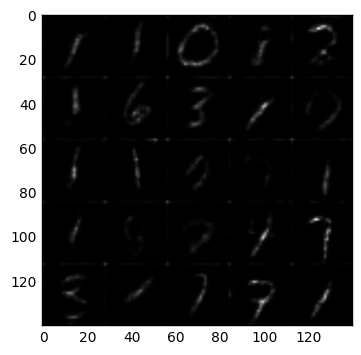

Epoch 2/2... Discriminator Loss: 1.4020... Generator Loss: 0.4340
Epoch 2/2... Discriminator Loss: 3.5773... Generator Loss: 0.0479
Epoch 2/2... Discriminator Loss: 2.8979... Generator Loss: 0.0915
Epoch 2/2... Discriminator Loss: 2.8595... Generator Loss: 0.0777
Epoch 2/2... Discriminator Loss: 2.7894... Generator Loss: 0.0944
Epoch 2/2... Discriminator Loss: 3.1863... Generator Loss: 0.0756
Epoch 2/2... Discriminator Loss: 2.7438... Generator Loss: 0.1035
Epoch 2/2... Discriminator Loss: 3.5994... Generator Loss: 0.0437
Epoch 2/2... Discriminator Loss: 2.8137... Generator Loss: 0.0840
Epoch 2/2... Discriminator Loss: 4.3943... Generator Loss: 6.8322


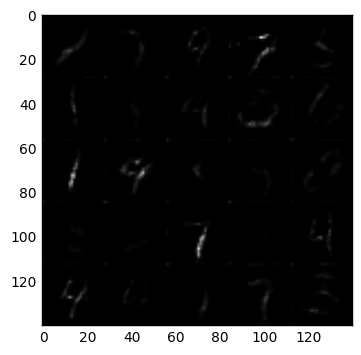

Epoch 2/2... Discriminator Loss: 0.8863... Generator Loss: 0.8543
Epoch 2/2... Discriminator Loss: 1.0865... Generator Loss: 0.5085
Epoch 2/2... Discriminator Loss: 0.6543... Generator Loss: 1.2109
Epoch 2/2... Discriminator Loss: 0.6785... Generator Loss: 1.4268
Epoch 2/2... Discriminator Loss: 1.1421... Generator Loss: 0.4666
Epoch 2/2... Discriminator Loss: 1.5704... Generator Loss: 0.2956
Epoch 2/2... Discriminator Loss: 1.6634... Generator Loss: 0.3033
Epoch 2/2... Discriminator Loss: 1.6507... Generator Loss: 0.3047
Epoch 2/2... Discriminator Loss: 1.3393... Generator Loss: 0.8088
Epoch 2/2... Discriminator Loss: 2.5310... Generator Loss: 0.1367


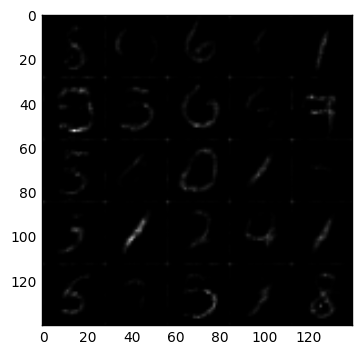

Epoch 2/2... Discriminator Loss: 2.3097... Generator Loss: 0.1914
Epoch 2/2... Discriminator Loss: 2.7567... Generator Loss: 0.0884
Epoch 2/2... Discriminator Loss: 1.8550... Generator Loss: 0.2844
Epoch 2/2... Discriminator Loss: 3.6884... Generator Loss: 0.0371
Epoch 2/2... Discriminator Loss: 1.8159... Generator Loss: 0.2816
Epoch 2/2... Discriminator Loss: 2.3464... Generator Loss: 0.1466
Epoch 2/2... Discriminator Loss: 3.8944... Generator Loss: 0.0338
Epoch 2/2... Discriminator Loss: 1.8068... Generator Loss: 0.2504


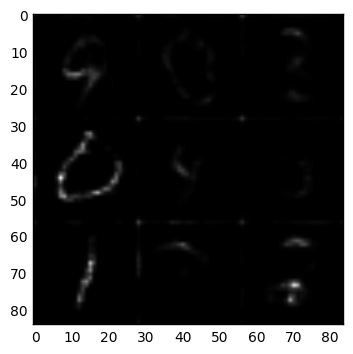

In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

(202599, 28, 28, 3)
Epoch 1/1... Discriminator Loss: 3.3725... Generator Loss: 0.0374
Epoch 1/1... Discriminator Loss: 3.1566... Generator Loss: 0.0503
Epoch 1/1... Discriminator Loss: 2.0945... Generator Loss: 0.1541
Epoch 1/1... Discriminator Loss: 2.0391... Generator Loss: 0.2248
Epoch 1/1... Discriminator Loss: 1.4982... Generator Loss: 0.6176
Epoch 1/1... Discriminator Loss: 1.6725... Generator Loss: 0.4776
Epoch 1/1... Discriminator Loss: 1.6426... Generator Loss: 0.4262
Epoch 1/1... Discriminator Loss: 1.9349... Generator Loss: 0.2174
Epoch 1/1... Discriminator Loss: 1.9917... Generator Loss: 0.2261


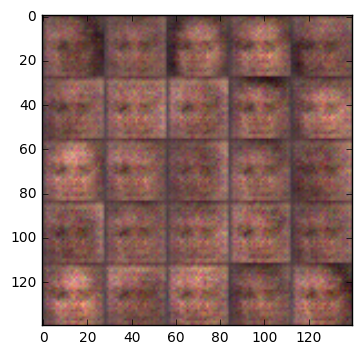

Epoch 1/1... Discriminator Loss: 1.3832... Generator Loss: 0.6682
Epoch 1/1... Discriminator Loss: 1.5286... Generator Loss: 0.6291
Epoch 1/1... Discriminator Loss: 1.4657... Generator Loss: 0.5417
Epoch 1/1... Discriminator Loss: 1.3284... Generator Loss: 0.7155
Epoch 1/1... Discriminator Loss: 1.6781... Generator Loss: 0.5658
Epoch 1/1... Discriminator Loss: 1.1130... Generator Loss: 0.8108
Epoch 1/1... Discriminator Loss: 1.7610... Generator Loss: 0.2813
Epoch 1/1... Discriminator Loss: 1.6523... Generator Loss: 0.7530
Epoch 1/1... Discriminator Loss: 1.9596... Generator Loss: 0.1964
Epoch 1/1... Discriminator Loss: 1.6450... Generator Loss: 0.3460


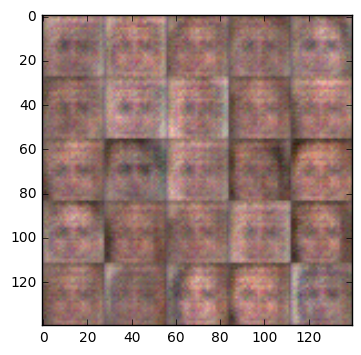

Epoch 1/1... Discriminator Loss: 1.6732... Generator Loss: 0.3266
Epoch 1/1... Discriminator Loss: 1.4208... Generator Loss: 0.5761
Epoch 1/1... Discriminator Loss: 1.5278... Generator Loss: 0.4654
Epoch 1/1... Discriminator Loss: 1.6960... Generator Loss: 0.5811
Epoch 1/1... Discriminator Loss: 1.9132... Generator Loss: 0.2509
Epoch 1/1... Discriminator Loss: 1.8154... Generator Loss: 0.2864
Epoch 1/1... Discriminator Loss: 1.4328... Generator Loss: 0.5001
Epoch 1/1... Discriminator Loss: 1.6434... Generator Loss: 0.4601
Epoch 1/1... Discriminator Loss: 1.7522... Generator Loss: 0.3256
Epoch 1/1... Discriminator Loss: 1.7457... Generator Loss: 0.2823


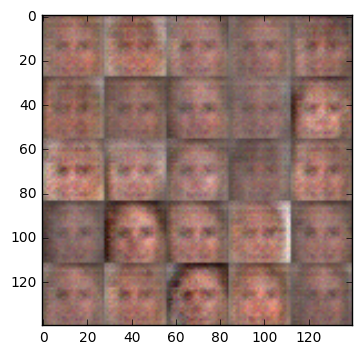

Epoch 1/1... Discriminator Loss: 1.7196... Generator Loss: 0.3423
Epoch 1/1... Discriminator Loss: 1.5887... Generator Loss: 0.3932
Epoch 1/1... Discriminator Loss: 1.6716... Generator Loss: 0.5390
Epoch 1/1... Discriminator Loss: 1.3278... Generator Loss: 0.6767
Epoch 1/1... Discriminator Loss: 1.5293... Generator Loss: 0.4975
Epoch 1/1... Discriminator Loss: 1.4382... Generator Loss: 0.5546
Epoch 1/1... Discriminator Loss: 1.4078... Generator Loss: 0.5989
Epoch 1/1... Discriminator Loss: 1.5734... Generator Loss: 0.4733
Epoch 1/1... Discriminator Loss: 1.5743... Generator Loss: 0.5027
Epoch 1/1... Discriminator Loss: 1.4545... Generator Loss: 0.5478


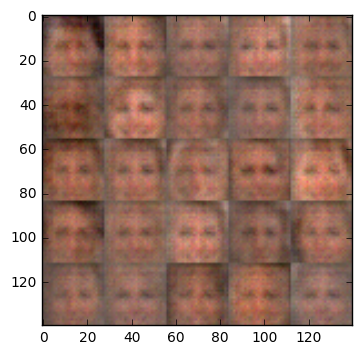

Epoch 1/1... Discriminator Loss: 1.3970... Generator Loss: 0.6678
Epoch 1/1... Discriminator Loss: 1.4128... Generator Loss: 0.6115
Epoch 1/1... Discriminator Loss: 1.4305... Generator Loss: 0.5770
Epoch 1/1... Discriminator Loss: 1.3617... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.4459... Generator Loss: 0.5245
Epoch 1/1... Discriminator Loss: 1.4732... Generator Loss: 0.4763
Epoch 1/1... Discriminator Loss: 1.6087... Generator Loss: 0.4124
Epoch 1/1... Discriminator Loss: 1.4458... Generator Loss: 0.5606
Epoch 1/1... Discriminator Loss: 1.4708... Generator Loss: 0.6038
Epoch 1/1... Discriminator Loss: 1.4539... Generator Loss: 0.5007


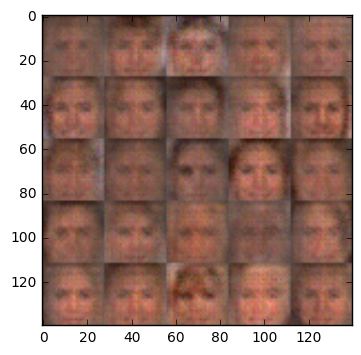

Epoch 1/1... Discriminator Loss: 1.3684... Generator Loss: 0.5490
Epoch 1/1... Discriminator Loss: 1.5595... Generator Loss: 0.4223
Epoch 1/1... Discriminator Loss: 1.4703... Generator Loss: 0.4876
Epoch 1/1... Discriminator Loss: 1.3298... Generator Loss: 0.5148
Epoch 1/1... Discriminator Loss: 1.5520... Generator Loss: 0.4837
Epoch 1/1... Discriminator Loss: 1.4769... Generator Loss: 0.4514
Epoch 1/1... Discriminator Loss: 1.6779... Generator Loss: 0.4202
Epoch 1/1... Discriminator Loss: 1.5503... Generator Loss: 0.4525
Epoch 1/1... Discriminator Loss: 1.5246... Generator Loss: 0.4699
Epoch 1/1... Discriminator Loss: 1.5379... Generator Loss: 0.4196


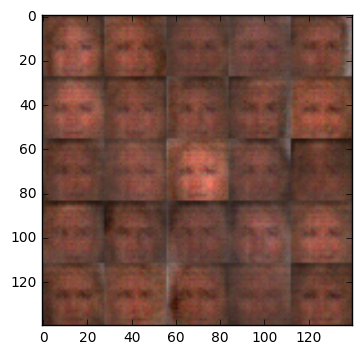

Epoch 1/1... Discriminator Loss: 1.6002... Generator Loss: 0.4033
Epoch 1/1... Discriminator Loss: 1.5134... Generator Loss: 0.5044
Epoch 1/1... Discriminator Loss: 1.4332... Generator Loss: 0.4707
Epoch 1/1... Discriminator Loss: 1.5002... Generator Loss: 0.4720
Epoch 1/1... Discriminator Loss: 1.4729... Generator Loss: 0.4709
Epoch 1/1... Discriminator Loss: 1.4662... Generator Loss: 0.4710
Epoch 1/1... Discriminator Loss: 1.5760... Generator Loss: 0.4698
Epoch 1/1... Discriminator Loss: 1.5067... Generator Loss: 0.4937
Epoch 1/1... Discriminator Loss: 1.5536... Generator Loss: 0.4310
Epoch 1/1... Discriminator Loss: 1.7356... Generator Loss: 0.3743


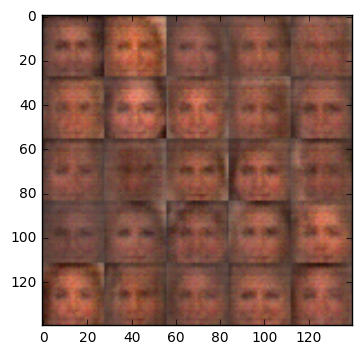

Epoch 1/1... Discriminator Loss: 1.5367... Generator Loss: 0.7462
Epoch 1/1... Discriminator Loss: 1.6039... Generator Loss: 0.4358
Epoch 1/1... Discriminator Loss: 1.5028... Generator Loss: 0.5183
Epoch 1/1... Discriminator Loss: 1.4081... Generator Loss: 0.4971
Epoch 1/1... Discriminator Loss: 1.4711... Generator Loss: 0.4682
Epoch 1/1... Discriminator Loss: 1.6191... Generator Loss: 0.4525
Epoch 1/1... Discriminator Loss: 1.4696... Generator Loss: 0.4437
Epoch 1/1... Discriminator Loss: 1.5113... Generator Loss: 0.4616
Epoch 1/1... Discriminator Loss: 1.4125... Generator Loss: 0.5151
Epoch 1/1... Discriminator Loss: 1.5310... Generator Loss: 0.4064


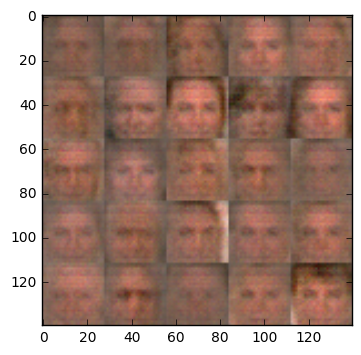

Epoch 1/1... Discriminator Loss: 1.5542... Generator Loss: 0.4394
Epoch 1/1... Discriminator Loss: 1.5118... Generator Loss: 0.4623
Epoch 1/1... Discriminator Loss: 1.6485... Generator Loss: 0.3614
Epoch 1/1... Discriminator Loss: 1.5932... Generator Loss: 0.4442
Epoch 1/1... Discriminator Loss: 1.3620... Generator Loss: 0.5585
Epoch 1/1... Discriminator Loss: 1.5269... Generator Loss: 0.4599
Epoch 1/1... Discriminator Loss: 1.4720... Generator Loss: 0.4692
Epoch 1/1... Discriminator Loss: 1.5449... Generator Loss: 0.4410
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.6053
Epoch 1/1... Discriminator Loss: 1.5499... Generator Loss: 0.4265


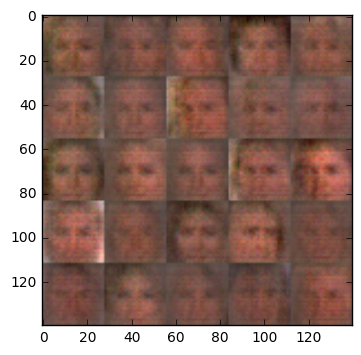

Epoch 1/1... Discriminator Loss: 1.6487... Generator Loss: 0.3999
Epoch 1/1... Discriminator Loss: 1.4945... Generator Loss: 0.4807
Epoch 1/1... Discriminator Loss: 1.5634... Generator Loss: 0.4948
Epoch 1/1... Discriminator Loss: 1.7089... Generator Loss: 0.5118
Epoch 1/1... Discriminator Loss: 1.5369... Generator Loss: 0.4317
Epoch 1/1... Discriminator Loss: 1.6602... Generator Loss: 0.3785
Epoch 1/1... Discriminator Loss: 1.4913... Generator Loss: 0.5138
Epoch 1/1... Discriminator Loss: 1.4553... Generator Loss: 0.5187
Epoch 1/1... Discriminator Loss: 1.6108... Generator Loss: 0.4030
Epoch 1/1... Discriminator Loss: 1.6280... Generator Loss: 0.4048


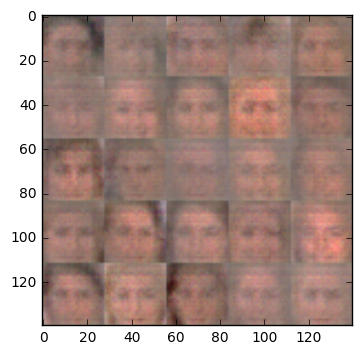

Epoch 1/1... Discriminator Loss: 1.4001... Generator Loss: 0.5161
Epoch 1/1... Discriminator Loss: 1.5183... Generator Loss: 0.4336
Epoch 1/1... Discriminator Loss: 1.6129... Generator Loss: 0.4632
Epoch 1/1... Discriminator Loss: 1.4863... Generator Loss: 0.5089
Epoch 1/1... Discriminator Loss: 1.6058... Generator Loss: 0.4675
Epoch 1/1... Discriminator Loss: 1.6446... Generator Loss: 0.4852
Epoch 1/1... Discriminator Loss: 1.4668... Generator Loss: 0.4881
Epoch 1/1... Discriminator Loss: 1.6019... Generator Loss: 0.4574
Epoch 1/1... Discriminator Loss: 1.5183... Generator Loss: 0.4344
Epoch 1/1... Discriminator Loss: 1.4644... Generator Loss: 0.4397


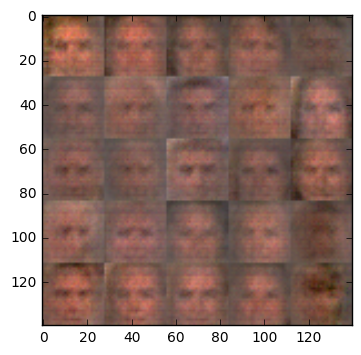

Epoch 1/1... Discriminator Loss: 1.6572... Generator Loss: 0.4153
Epoch 1/1... Discriminator Loss: 1.5041... Generator Loss: 0.5272
Epoch 1/1... Discriminator Loss: 1.4914... Generator Loss: 0.5556
Epoch 1/1... Discriminator Loss: 1.6342... Generator Loss: 0.4210
Epoch 1/1... Discriminator Loss: 1.6817... Generator Loss: 0.4250
Epoch 1/1... Discriminator Loss: 1.5206... Generator Loss: 0.5130
Epoch 1/1... Discriminator Loss: 1.6669... Generator Loss: 0.3534
Epoch 1/1... Discriminator Loss: 1.5535... Generator Loss: 0.4702
Epoch 1/1... Discriminator Loss: 1.5845... Generator Loss: 0.4033
Epoch 1/1... Discriminator Loss: 1.6517... Generator Loss: 0.4713


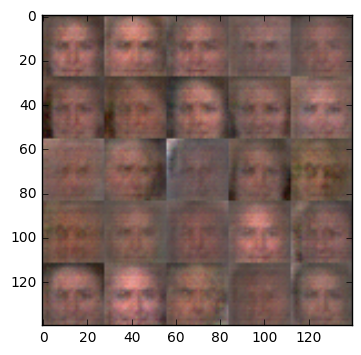

Epoch 1/1... Discriminator Loss: 1.5958... Generator Loss: 0.4213
Epoch 1/1... Discriminator Loss: 1.6694... Generator Loss: 0.3484
Epoch 1/1... Discriminator Loss: 1.6187... Generator Loss: 0.4766
Epoch 1/1... Discriminator Loss: 1.5649... Generator Loss: 0.4462
Epoch 1/1... Discriminator Loss: 1.5101... Generator Loss: 0.4683
Epoch 1/1... Discriminator Loss: 1.5368... Generator Loss: 0.3906
Epoch 1/1... Discriminator Loss: 1.6163... Generator Loss: 0.3842
Epoch 1/1... Discriminator Loss: 1.5800... Generator Loss: 0.4309
Epoch 1/1... Discriminator Loss: 1.3992... Generator Loss: 0.5636
Epoch 1/1... Discriminator Loss: 1.5781... Generator Loss: 0.3818


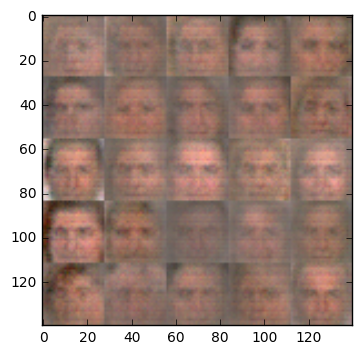

Epoch 1/1... Discriminator Loss: 1.7481... Generator Loss: 0.3321
Epoch 1/1... Discriminator Loss: 1.3774... Generator Loss: 0.6078
Epoch 1/1... Discriminator Loss: 1.5561... Generator Loss: 0.4721
Epoch 1/1... Discriminator Loss: 1.9076... Generator Loss: 0.2968
Epoch 1/1... Discriminator Loss: 1.7123... Generator Loss: 0.3488
Epoch 1/1... Discriminator Loss: 1.4527... Generator Loss: 0.4956
Epoch 1/1... Discriminator Loss: 1.9175... Generator Loss: 0.2984
Epoch 1/1... Discriminator Loss: 1.7603... Generator Loss: 0.3637
Epoch 1/1... Discriminator Loss: 1.6297... Generator Loss: 0.4004
Epoch 1/1... Discriminator Loss: 1.5926... Generator Loss: 0.4012


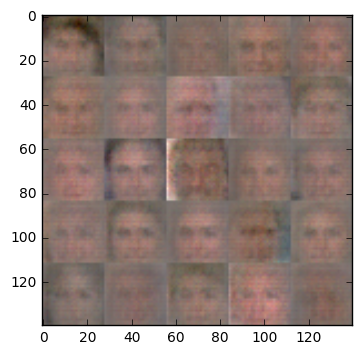

Epoch 1/1... Discriminator Loss: 1.5316... Generator Loss: 0.4862
Epoch 1/1... Discriminator Loss: 1.4417... Generator Loss: 0.4254
Epoch 1/1... Discriminator Loss: 1.5773... Generator Loss: 0.3982
Epoch 1/1... Discriminator Loss: 1.5680... Generator Loss: 0.4556
Epoch 1/1... Discriminator Loss: 1.5658... Generator Loss: 0.4992
Epoch 1/1... Discriminator Loss: 1.9382... Generator Loss: 0.2757
Epoch 1/1... Discriminator Loss: 1.3513... Generator Loss: 0.5288
Epoch 1/1... Discriminator Loss: 1.7536... Generator Loss: 0.3082
Epoch 1/1... Discriminator Loss: 1.5239... Generator Loss: 0.5108
Epoch 1/1... Discriminator Loss: 1.4717... Generator Loss: 0.5576


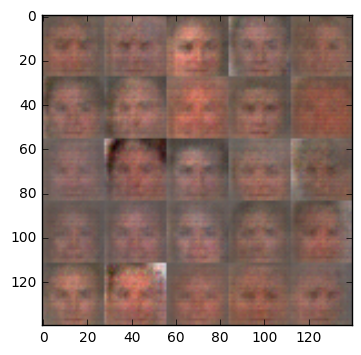

Epoch 1/1... Discriminator Loss: 1.6373... Generator Loss: 0.4288
Epoch 1/1... Discriminator Loss: 1.7026... Generator Loss: 0.3670
Epoch 1/1... Discriminator Loss: 1.5060... Generator Loss: 0.4784
Epoch 1/1... Discriminator Loss: 1.7313... Generator Loss: 0.3582
Epoch 1/1... Discriminator Loss: 1.5900... Generator Loss: 0.4095
Epoch 1/1... Discriminator Loss: 1.4212... Generator Loss: 0.5310
Epoch 1/1... Discriminator Loss: 1.5039... Generator Loss: 0.5318
Epoch 1/1... Discriminator Loss: 1.6573... Generator Loss: 0.3642
Epoch 1/1... Discriminator Loss: 1.5163... Generator Loss: 0.4703
Epoch 1/1... Discriminator Loss: 1.5723... Generator Loss: 0.4563


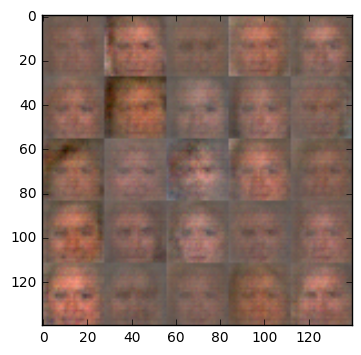

Epoch 1/1... Discriminator Loss: 1.4341... Generator Loss: 0.4899
Epoch 1/1... Discriminator Loss: 1.6667... Generator Loss: 0.3243
Epoch 1/1... Discriminator Loss: 1.7182... Generator Loss: 0.3222
Epoch 1/1... Discriminator Loss: 1.9550... Generator Loss: 0.2517
Epoch 1/1... Discriminator Loss: 1.6041... Generator Loss: 0.3790
Epoch 1/1... Discriminator Loss: 1.6494... Generator Loss: 0.4379
Epoch 1/1... Discriminator Loss: 1.6004... Generator Loss: 0.5205
Epoch 1/1... Discriminator Loss: 1.6007... Generator Loss: 0.4280
Epoch 1/1... Discriminator Loss: 1.5128... Generator Loss: 0.4573
Epoch 1/1... Discriminator Loss: 1.6023... Generator Loss: 0.3932


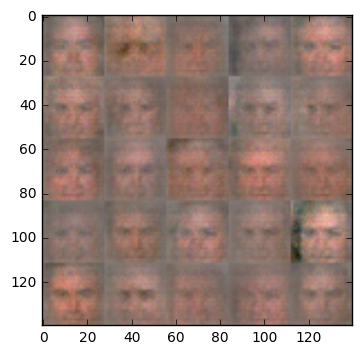

Epoch 1/1... Discriminator Loss: 1.5552... Generator Loss: 0.4630
Epoch 1/1... Discriminator Loss: 1.5449... Generator Loss: 0.4160
Epoch 1/1... Discriminator Loss: 1.6138... Generator Loss: 0.3711
Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.5396
Epoch 1/1... Discriminator Loss: 1.6651... Generator Loss: 0.4740
Epoch 1/1... Discriminator Loss: 1.4623... Generator Loss: 0.4946
Epoch 1/1... Discriminator Loss: 1.6364... Generator Loss: 0.4728
Epoch 1/1... Discriminator Loss: 1.5511... Generator Loss: 0.4219
Epoch 1/1... Discriminator Loss: 1.6244... Generator Loss: 0.3542
Epoch 1/1... Discriminator Loss: 1.6571... Generator Loss: 0.4221


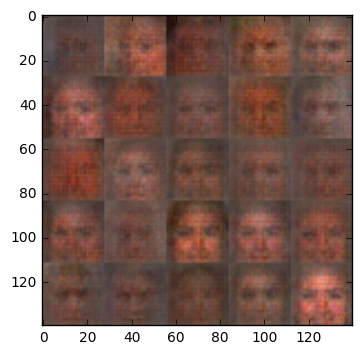

Epoch 1/1... Discriminator Loss: 1.5549... Generator Loss: 0.4560
Epoch 1/1... Discriminator Loss: 1.8294... Generator Loss: 0.3080
Epoch 1/1... Discriminator Loss: 1.5016... Generator Loss: 0.3990
Epoch 1/1... Discriminator Loss: 1.6084... Generator Loss: 0.4446
Epoch 1/1... Discriminator Loss: 1.5880... Generator Loss: 0.4021
Epoch 1/1... Discriminator Loss: 1.4992... Generator Loss: 0.4756
Epoch 1/1... Discriminator Loss: 1.6612... Generator Loss: 0.3583
Epoch 1/1... Discriminator Loss: 1.4746... Generator Loss: 0.4659
Epoch 1/1... Discriminator Loss: 1.5544... Generator Loss: 0.4489
Epoch 1/1... Discriminator Loss: 1.4884... Generator Loss: 0.4389


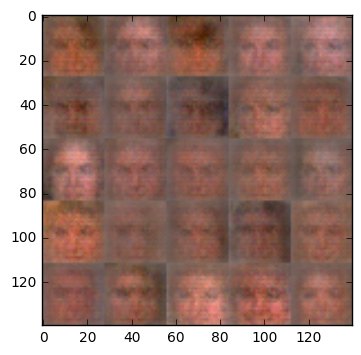

Epoch 1/1... Discriminator Loss: 1.6018... Generator Loss: 0.4065
Epoch 1/1... Discriminator Loss: 1.5705... Generator Loss: 0.4047
Epoch 1/1... Discriminator Loss: 1.9992... Generator Loss: 0.2506
Epoch 1/1... Discriminator Loss: 1.9079... Generator Loss: 0.2569
Epoch 1/1... Discriminator Loss: 1.4196... Generator Loss: 0.5535
Epoch 1/1... Discriminator Loss: 1.7537... Generator Loss: 0.3662
Epoch 1/1... Discriminator Loss: 1.4591... Generator Loss: 0.5024
Epoch 1/1... Discriminator Loss: 1.4804... Generator Loss: 0.4754
Epoch 1/1... Discriminator Loss: 1.7690... Generator Loss: 0.2948
Epoch 1/1... Discriminator Loss: 1.5538... Generator Loss: 0.3545


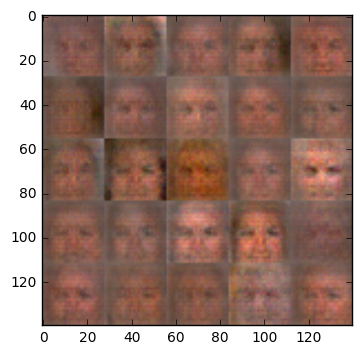

Epoch 1/1... Discriminator Loss: 1.3795... Generator Loss: 0.5051
Epoch 1/1... Discriminator Loss: 1.7908... Generator Loss: 0.3193
Epoch 1/1... Discriminator Loss: 1.5921... Generator Loss: 0.4367
Epoch 1/1... Discriminator Loss: 1.5244... Generator Loss: 0.4110
Epoch 1/1... Discriminator Loss: 1.4488... Generator Loss: 0.5118
Epoch 1/1... Discriminator Loss: 1.6004... Generator Loss: 0.3538
Epoch 1/1... Discriminator Loss: 1.6745... Generator Loss: 0.3866
Epoch 1/1... Discriminator Loss: 1.3376... Generator Loss: 0.5728
Epoch 1/1... Discriminator Loss: 1.6546... Generator Loss: 0.3852
Epoch 1/1... Discriminator Loss: 1.2254... Generator Loss: 0.6026


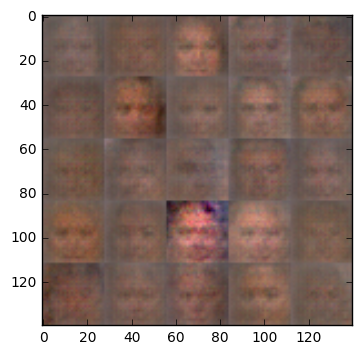

Epoch 1/1... Discriminator Loss: 1.6446... Generator Loss: 0.3279
Epoch 1/1... Discriminator Loss: 1.6236... Generator Loss: 0.3946
Epoch 1/1... Discriminator Loss: 1.6649... Generator Loss: 0.4090
Epoch 1/1... Discriminator Loss: 1.5988... Generator Loss: 0.3377
Epoch 1/1... Discriminator Loss: 1.4137... Generator Loss: 0.5576
Epoch 1/1... Discriminator Loss: 1.8543... Generator Loss: 0.3181
Epoch 1/1... Discriminator Loss: 1.6307... Generator Loss: 0.3564
Epoch 1/1... Discriminator Loss: 1.6555... Generator Loss: 0.3313
Epoch 1/1... Discriminator Loss: 1.4369... Generator Loss: 0.5771
Epoch 1/1... Discriminator Loss: 1.5238... Generator Loss: 0.4729


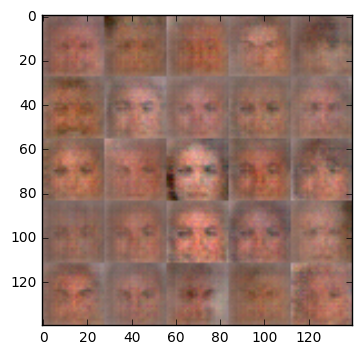

Epoch 1/1... Discriminator Loss: 1.8006... Generator Loss: 0.2967
Epoch 1/1... Discriminator Loss: 1.7843... Generator Loss: 0.2771
Epoch 1/1... Discriminator Loss: 1.5410... Generator Loss: 0.3618
Epoch 1/1... Discriminator Loss: 1.6963... Generator Loss: 0.2926
Epoch 1/1... Discriminator Loss: 1.5954... Generator Loss: 0.3621
Epoch 1/1... Discriminator Loss: 1.6033... Generator Loss: 0.3300
Epoch 1/1... Discriminator Loss: 1.5630... Generator Loss: 0.3682
Epoch 1/1... Discriminator Loss: 1.5827... Generator Loss: 0.3617
Epoch 1/1... Discriminator Loss: 1.5539... Generator Loss: 0.3860
Epoch 1/1... Discriminator Loss: 1.5806... Generator Loss: 0.4096


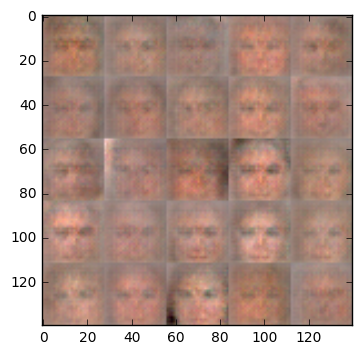

Epoch 1/1... Discriminator Loss: 1.5467... Generator Loss: 0.4297
Epoch 1/1... Discriminator Loss: 1.4720... Generator Loss: 0.4845
Epoch 1/1... Discriminator Loss: 2.0297... Generator Loss: 0.2331
Epoch 1/1... Discriminator Loss: 1.4388... Generator Loss: 0.4862
Epoch 1/1... Discriminator Loss: 1.8894... Generator Loss: 0.3504
Epoch 1/1... Discriminator Loss: 1.6182... Generator Loss: 0.3790
Epoch 1/1... Discriminator Loss: 1.7342... Generator Loss: 0.3964
Epoch 1/1... Discriminator Loss: 1.6342... Generator Loss: 0.3003
Epoch 1/1... Discriminator Loss: 1.6176... Generator Loss: 0.4343
Epoch 1/1... Discriminator Loss: 2.2143... Generator Loss: 0.1820


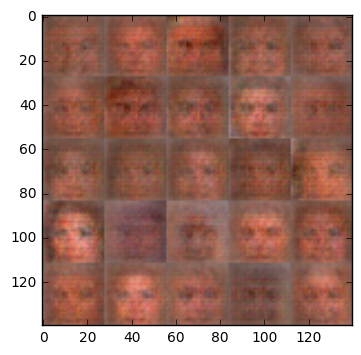

Epoch 1/1... Discriminator Loss: 1.7353... Generator Loss: 0.3024
Epoch 1/1... Discriminator Loss: 1.4082... Generator Loss: 0.5636
Epoch 1/1... Discriminator Loss: 1.5730... Generator Loss: 0.6204
Epoch 1/1... Discriminator Loss: 1.6877... Generator Loss: 0.3663
Epoch 1/1... Discriminator Loss: 1.5083... Generator Loss: 0.4331
Epoch 1/1... Discriminator Loss: 1.8770... Generator Loss: 0.2372
Epoch 1/1... Discriminator Loss: 1.6372... Generator Loss: 0.3476
Epoch 1/1... Discriminator Loss: 1.5803... Generator Loss: 0.4360
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.4582
Epoch 1/1... Discriminator Loss: 1.6540... Generator Loss: 0.3281


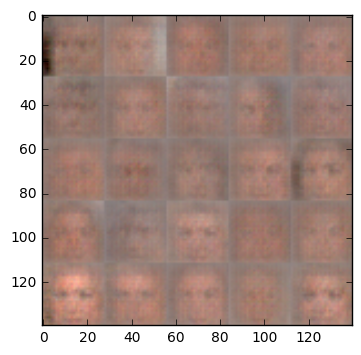

Epoch 1/1... Discriminator Loss: 1.5102... Generator Loss: 0.3904
Epoch 1/1... Discriminator Loss: 1.5832... Generator Loss: 0.4617
Epoch 1/1... Discriminator Loss: 1.6967... Generator Loss: 0.3479
Epoch 1/1... Discriminator Loss: 1.6342... Generator Loss: 0.3389
Epoch 1/1... Discriminator Loss: 1.7135... Generator Loss: 0.3298
Epoch 1/1... Discriminator Loss: 1.4927... Generator Loss: 0.4149
Epoch 1/1... Discriminator Loss: 1.6311... Generator Loss: 0.3469
Epoch 1/1... Discriminator Loss: 1.7728... Generator Loss: 0.2857
Epoch 1/1... Discriminator Loss: 1.7862... Generator Loss: 0.2782
Epoch 1/1... Discriminator Loss: 1.7025... Generator Loss: 0.2892


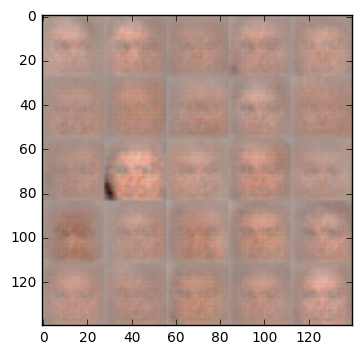

Epoch 1/1... Discriminator Loss: 1.5760... Generator Loss: 0.4066
Epoch 1/1... Discriminator Loss: 1.6123... Generator Loss: 0.3674
Epoch 1/1... Discriminator Loss: 1.6006... Generator Loss: 0.5265
Epoch 1/1... Discriminator Loss: 1.6861... Generator Loss: 0.3153
Epoch 1/1... Discriminator Loss: 1.6568... Generator Loss: 0.4559
Epoch 1/1... Discriminator Loss: 1.8135... Generator Loss: 0.2335
Epoch 1/1... Discriminator Loss: 1.7170... Generator Loss: 0.2793
Epoch 1/1... Discriminator Loss: 1.8059... Generator Loss: 0.2994
Epoch 1/1... Discriminator Loss: 1.7157... Generator Loss: 0.3167
Epoch 1/1... Discriminator Loss: 1.4085... Generator Loss: 0.4781


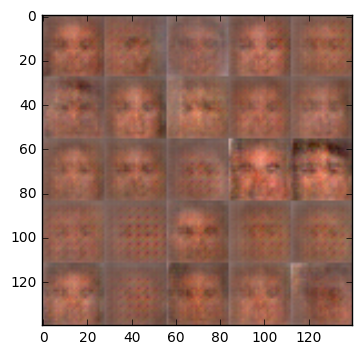

Epoch 1/1... Discriminator Loss: 1.9409... Generator Loss: 0.2533
Epoch 1/1... Discriminator Loss: 1.9065... Generator Loss: 0.3200
Epoch 1/1... Discriminator Loss: 1.6907... Generator Loss: 0.3266
Epoch 1/1... Discriminator Loss: 1.6416... Generator Loss: 0.3349
Epoch 1/1... Discriminator Loss: 2.0395... Generator Loss: 0.2146
Epoch 1/1... Discriminator Loss: 1.5815... Generator Loss: 0.3617
Epoch 1/1... Discriminator Loss: 1.7910... Generator Loss: 0.2687
Epoch 1/1... Discriminator Loss: 1.4577... Generator Loss: 0.4591
Epoch 1/1... Discriminator Loss: 1.7247... Generator Loss: 0.3382
Epoch 1/1... Discriminator Loss: 1.8262... Generator Loss: 0.2529


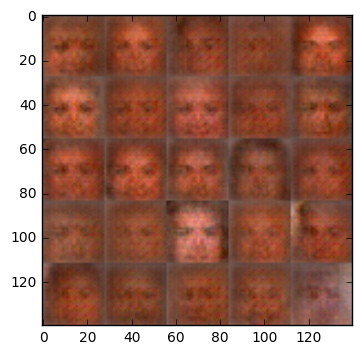

Epoch 1/1... Discriminator Loss: 1.5448... Generator Loss: 0.3498
Epoch 1/1... Discriminator Loss: 1.3528... Generator Loss: 0.4429
Epoch 1/1... Discriminator Loss: 1.3507... Generator Loss: 0.5035
Epoch 1/1... Discriminator Loss: 1.5338... Generator Loss: 0.4055
Epoch 1/1... Discriminator Loss: 1.4039... Generator Loss: 0.4688
Epoch 1/1... Discriminator Loss: 1.9538... Generator Loss: 0.2285
Epoch 1/1... Discriminator Loss: 1.4348... Generator Loss: 0.4348
Epoch 1/1... Discriminator Loss: 1.6801... Generator Loss: 0.3287
Epoch 1/1... Discriminator Loss: 1.5020... Generator Loss: 0.4244
Epoch 1/1... Discriminator Loss: 1.6720... Generator Loss: 0.3384


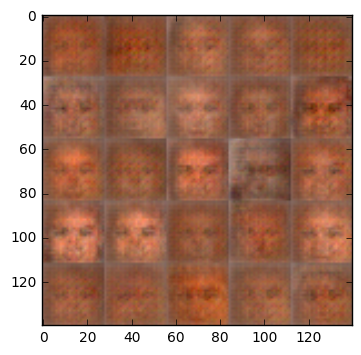

Epoch 1/1... Discriminator Loss: 1.5921... Generator Loss: 0.3309
Epoch 1/1... Discriminator Loss: 1.5439... Generator Loss: 0.4177
Epoch 1/1... Discriminator Loss: 1.6263... Generator Loss: 0.3583
Epoch 1/1... Discriminator Loss: 1.6670... Generator Loss: 0.3303
Epoch 1/1... Discriminator Loss: 1.7716... Generator Loss: 0.2897
Epoch 1/1... Discriminator Loss: 1.4713... Generator Loss: 0.4606
Epoch 1/1... Discriminator Loss: 1.5387... Generator Loss: 0.4242
Epoch 1/1... Discriminator Loss: 1.4960... Generator Loss: 0.3909
Epoch 1/1... Discriminator Loss: 1.9140... Generator Loss: 0.2402
Epoch 1/1... Discriminator Loss: 1.6328... Generator Loss: 0.3891


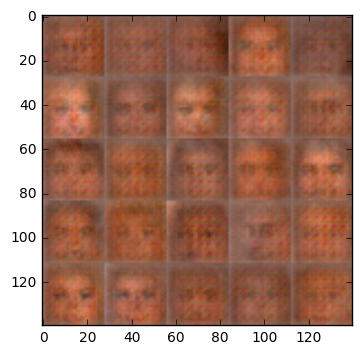

Epoch 1/1... Discriminator Loss: 1.5972... Generator Loss: 0.3511
Epoch 1/1... Discriminator Loss: 1.6727... Generator Loss: 0.3329
Epoch 1/1... Discriminator Loss: 1.6360... Generator Loss: 0.3497
Epoch 1/1... Discriminator Loss: 1.4467... Generator Loss: 0.4752
Epoch 1/1... Discriminator Loss: 1.5571... Generator Loss: 0.3786
Epoch 1/1... Discriminator Loss: 1.4610... Generator Loss: 0.5387
Epoch 1/1... Discriminator Loss: 1.5518... Generator Loss: 0.3424
Epoch 1/1... Discriminator Loss: 1.3959... Generator Loss: 0.3998
Epoch 1/1... Discriminator Loss: 2.0321... Generator Loss: 0.2607
Epoch 1/1... Discriminator Loss: 1.5547... Generator Loss: 0.4198


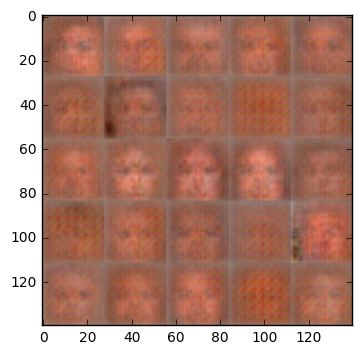

Epoch 1/1... Discriminator Loss: 1.7322... Generator Loss: 0.2965
Epoch 1/1... Discriminator Loss: 1.7948... Generator Loss: 0.2679
Epoch 1/1... Discriminator Loss: 1.6874... Generator Loss: 0.3298
Epoch 1/1... Discriminator Loss: 1.9983... Generator Loss: 0.3131
Epoch 1/1... Discriminator Loss: 1.6962... Generator Loss: 0.3318
Epoch 1/1... Discriminator Loss: 1.4857... Generator Loss: 0.3541
Epoch 1/1... Discriminator Loss: 1.5567... Generator Loss: 0.3917
Epoch 1/1... Discriminator Loss: 1.5413... Generator Loss: 0.3710
Epoch 1/1... Discriminator Loss: 1.9681... Generator Loss: 0.2413
Epoch 1/1... Discriminator Loss: 1.5863... Generator Loss: 0.3618


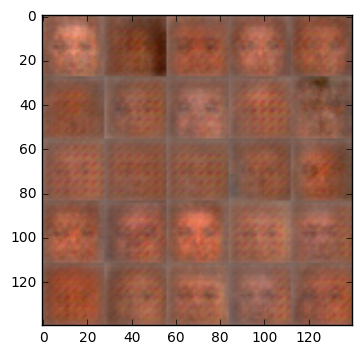

Epoch 1/1... Discriminator Loss: 1.7410... Generator Loss: 0.2752
Epoch 1/1... Discriminator Loss: 1.4116... Generator Loss: 0.4558
Epoch 1/1... Discriminator Loss: 1.7508... Generator Loss: 0.2619
Epoch 1/1... Discriminator Loss: 1.8068... Generator Loss: 0.2752
Epoch 1/1... Discriminator Loss: 1.5426... Generator Loss: 0.3784
Epoch 1/1... Discriminator Loss: 1.5201... Generator Loss: 0.3808
Epoch 1/1... Discriminator Loss: 1.7045... Generator Loss: 0.2936
Epoch 1/1... Discriminator Loss: 1.5741... Generator Loss: 0.4082
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.5014
Epoch 1/1... Discriminator Loss: 1.9322... Generator Loss: 0.2951


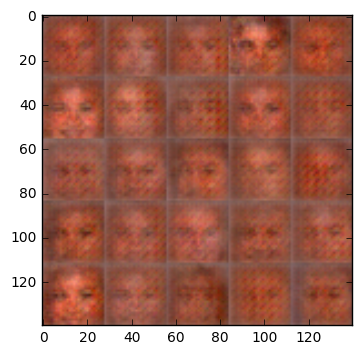

Epoch 1/1... Discriminator Loss: 1.6623... Generator Loss: 0.3701
Epoch 1/1... Discriminator Loss: 1.5773... Generator Loss: 0.3441
Epoch 1/1... Discriminator Loss: 1.9769... Generator Loss: 0.2100
Epoch 1/1... Discriminator Loss: 1.6642... Generator Loss: 0.3665
Epoch 1/1... Discriminator Loss: 1.9372... Generator Loss: 0.3320
Epoch 1/1... Discriminator Loss: 1.3681... Generator Loss: 0.4705
Epoch 1/1... Discriminator Loss: 1.6616... Generator Loss: 0.3163
Epoch 1/1... Discriminator Loss: 1.5885... Generator Loss: 0.3298
Epoch 1/1... Discriminator Loss: 1.5668... Generator Loss: 0.4285
Epoch 1/1... Discriminator Loss: 1.5224... Generator Loss: 0.4194


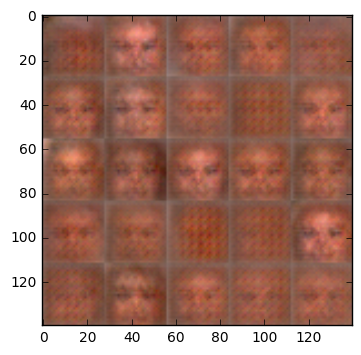

Epoch 1/1... Discriminator Loss: 1.6978... Generator Loss: 0.2857
Epoch 1/1... Discriminator Loss: 1.8224... Generator Loss: 0.2526
Epoch 1/1... Discriminator Loss: 1.8868... Generator Loss: 0.2415
Epoch 1/1... Discriminator Loss: 1.7547... Generator Loss: 0.2618
Epoch 1/1... Discriminator Loss: 1.7681... Generator Loss: 0.2696
Epoch 1/1... Discriminator Loss: 1.7541... Generator Loss: 0.3626
Epoch 1/1... Discriminator Loss: 1.4528... Generator Loss: 0.5689
Epoch 1/1... Discriminator Loss: 1.6503... Generator Loss: 0.3719
Epoch 1/1... Discriminator Loss: 1.8300... Generator Loss: 0.3452
Epoch 1/1... Discriminator Loss: 1.8715... Generator Loss: 0.3319


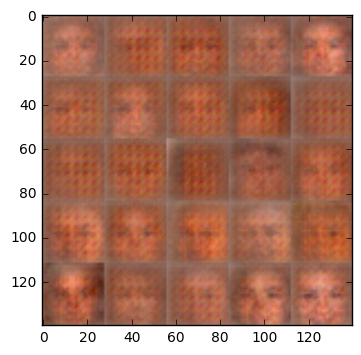

Epoch 1/1... Discriminator Loss: 1.2368... Generator Loss: 0.5681
Epoch 1/1... Discriminator Loss: 1.4921... Generator Loss: 0.3999
Epoch 1/1... Discriminator Loss: 1.5485... Generator Loss: 0.3228
Epoch 1/1... Discriminator Loss: 1.7691... Generator Loss: 0.2808
Epoch 1/1... Discriminator Loss: 1.6721... Generator Loss: 0.3645
Epoch 1/1... Discriminator Loss: 1.7524... Generator Loss: 0.4004
Epoch 1/1... Discriminator Loss: 1.6983... Generator Loss: 0.3286
Epoch 1/1... Discriminator Loss: 2.0832... Generator Loss: 0.1808
Epoch 1/1... Discriminator Loss: 1.6240... Generator Loss: 0.3406
Epoch 1/1... Discriminator Loss: 1.7192... Generator Loss: 0.4197


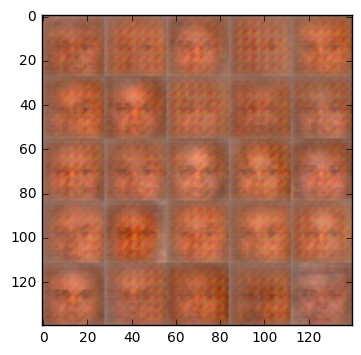

Epoch 1/1... Discriminator Loss: 2.0320... Generator Loss: 0.2081
Epoch 1/1... Discriminator Loss: 1.4414... Generator Loss: 0.4548
Epoch 1/1... Discriminator Loss: 1.4388... Generator Loss: 0.4792
Epoch 1/1... Discriminator Loss: 1.5104... Generator Loss: 0.4085
Epoch 1/1... Discriminator Loss: 1.7155... Generator Loss: 0.3027
Epoch 1/1... Discriminator Loss: 1.4980... Generator Loss: 0.3628
Epoch 1/1... Discriminator Loss: 1.8293... Generator Loss: 0.2824
Epoch 1/1... Discriminator Loss: 2.0057... Generator Loss: 0.2066
Epoch 1/1... Discriminator Loss: 1.5773... Generator Loss: 0.4430
Epoch 1/1... Discriminator Loss: 1.7333... Generator Loss: 0.3128


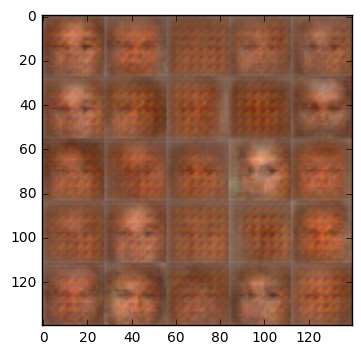

Epoch 1/1... Discriminator Loss: 1.5294... Generator Loss: 0.3675
Epoch 1/1... Discriminator Loss: 1.6206... Generator Loss: 0.3467
Epoch 1/1... Discriminator Loss: 1.5462... Generator Loss: 0.5490
Epoch 1/1... Discriminator Loss: 1.7570... Generator Loss: 0.3337
Epoch 1/1... Discriminator Loss: 1.5343... Generator Loss: 0.4239
Epoch 1/1... Discriminator Loss: 1.6963... Generator Loss: 0.3715
Epoch 1/1... Discriminator Loss: 1.6866... Generator Loss: 0.3230
Epoch 1/1... Discriminator Loss: 1.7860... Generator Loss: 0.3001
Epoch 1/1... Discriminator Loss: 1.7287... Generator Loss: 0.3039
Epoch 1/1... Discriminator Loss: 1.6080... Generator Loss: 0.4415


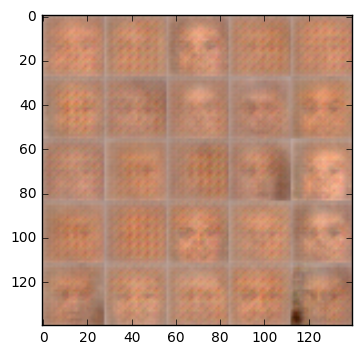

Epoch 1/1... Discriminator Loss: 1.8141... Generator Loss: 0.2299
Epoch 1/1... Discriminator Loss: 1.5993... Generator Loss: 0.3304
Epoch 1/1... Discriminator Loss: 1.3982... Generator Loss: 0.4391
Epoch 1/1... Discriminator Loss: 2.0656... Generator Loss: 0.1991
Epoch 1/1... Discriminator Loss: 1.8467... Generator Loss: 0.2174
Epoch 1/1... Discriminator Loss: 1.6770... Generator Loss: 0.3343
Epoch 1/1... Discriminator Loss: 1.7091... Generator Loss: 0.3203
Epoch 1/1... Discriminator Loss: 1.6476... Generator Loss: 0.3195
Epoch 1/1... Discriminator Loss: 1.6067... Generator Loss: 0.3421
Epoch 1/1... Discriminator Loss: 1.6554... Generator Loss: 0.3249


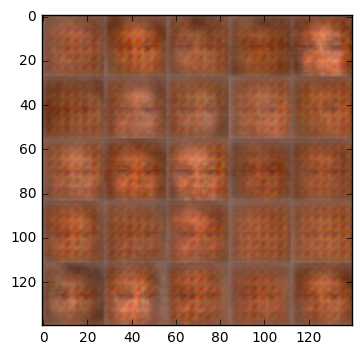

Epoch 1/1... Discriminator Loss: 1.8901... Generator Loss: 0.2113
Epoch 1/1... Discriminator Loss: 1.5532... Generator Loss: 0.3171
Epoch 1/1... Discriminator Loss: 2.0124... Generator Loss: 0.2369
Epoch 1/1... Discriminator Loss: 1.5787... Generator Loss: 0.3333
Epoch 1/1... Discriminator Loss: 1.5718... Generator Loss: 0.3453
Epoch 1/1... Discriminator Loss: 1.8246... Generator Loss: 0.2804
Epoch 1/1... Discriminator Loss: 1.4725... Generator Loss: 0.4402
Epoch 1/1... Discriminator Loss: 1.9514... Generator Loss: 0.2076
Epoch 1/1... Discriminator Loss: 1.2211... Generator Loss: 0.6035
Epoch 1/1... Discriminator Loss: 1.7403... Generator Loss: 0.2487


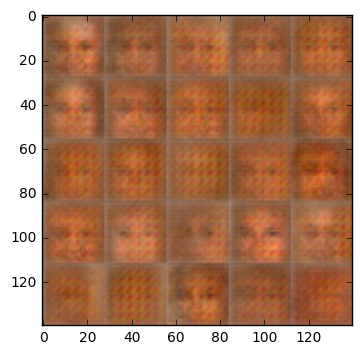

Epoch 1/1... Discriminator Loss: 2.0623... Generator Loss: 0.1864
Epoch 1/1... Discriminator Loss: 1.7611... Generator Loss: 0.3037
Epoch 1/1... Discriminator Loss: 1.9574... Generator Loss: 0.1954
Epoch 1/1... Discriminator Loss: 1.6670... Generator Loss: 0.2818
Epoch 1/1... Discriminator Loss: 1.9882... Generator Loss: 0.2147
Epoch 1/1... Discriminator Loss: 2.0465... Generator Loss: 0.1946
Epoch 1/1... Discriminator Loss: 1.5034... Generator Loss: 0.4619
Epoch 1/1... Discriminator Loss: 1.7306... Generator Loss: 0.2929
Epoch 1/1... Discriminator Loss: 2.0187... Generator Loss: 0.1919
Epoch 1/1... Discriminator Loss: 1.8158... Generator Loss: 0.2401


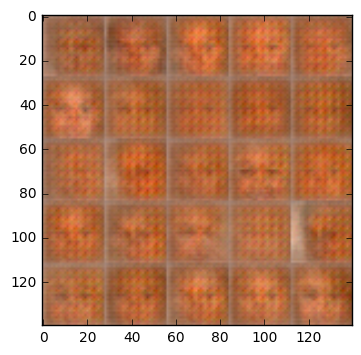

Epoch 1/1... Discriminator Loss: 1.5474... Generator Loss: 0.3612
Epoch 1/1... Discriminator Loss: 1.7741... Generator Loss: 0.2776
Epoch 1/1... Discriminator Loss: 1.8266... Generator Loss: 0.3159
Epoch 1/1... Discriminator Loss: 1.8247... Generator Loss: 0.2910
Epoch 1/1... Discriminator Loss: 1.5294... Generator Loss: 0.3135
Epoch 1/1... Discriminator Loss: 1.7275... Generator Loss: 0.2997
Epoch 1/1... Discriminator Loss: 1.7027... Generator Loss: 0.2709
Epoch 1/1... Discriminator Loss: 1.5464... Generator Loss: 0.5309
Epoch 1/1... Discriminator Loss: 1.4022... Generator Loss: 0.4624
Epoch 1/1... Discriminator Loss: 1.4880... Generator Loss: 0.3934


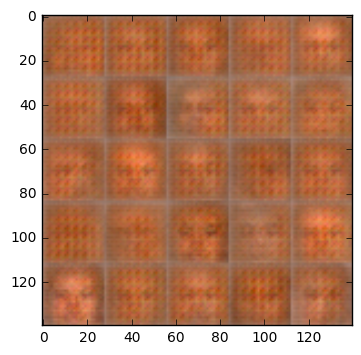

Epoch 1/1... Discriminator Loss: 1.5826... Generator Loss: 0.3726
Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 0.4376
Epoch 1/1... Discriminator Loss: 1.3018... Generator Loss: 0.5453
Epoch 1/1... Discriminator Loss: 1.5961... Generator Loss: 0.3330
Epoch 1/1... Discriminator Loss: 1.6744... Generator Loss: 0.3570
Epoch 1/1... Discriminator Loss: 1.8469... Generator Loss: 0.2413
Epoch 1/1... Discriminator Loss: 1.5337... Generator Loss: 0.3750
Epoch 1/1... Discriminator Loss: 1.5962... Generator Loss: 0.3039
Epoch 1/1... Discriminator Loss: 1.8366... Generator Loss: 0.2462
Epoch 1/1... Discriminator Loss: 1.8940... Generator Loss: 0.2369


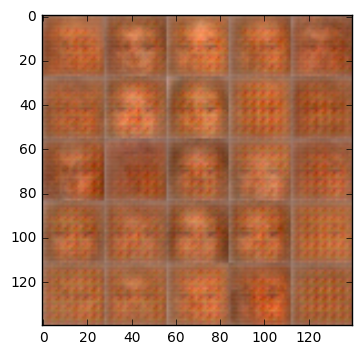

Epoch 1/1... Discriminator Loss: 1.8475... Generator Loss: 0.2479
Epoch 1/1... Discriminator Loss: 1.8132... Generator Loss: 0.2330
Epoch 1/1... Discriminator Loss: 1.7349... Generator Loss: 0.2584
Epoch 1/1... Discriminator Loss: 1.6741... Generator Loss: 0.2919
Epoch 1/1... Discriminator Loss: 1.7090... Generator Loss: 0.3276
Epoch 1/1... Discriminator Loss: 1.9937... Generator Loss: 0.1932
Epoch 1/1... Discriminator Loss: 2.2269... Generator Loss: 0.1611
Epoch 1/1... Discriminator Loss: 1.9590... Generator Loss: 0.2080
Epoch 1/1... Discriminator Loss: 1.8502... Generator Loss: 0.2546
Epoch 1/1... Discriminator Loss: 1.6908... Generator Loss: 0.3463


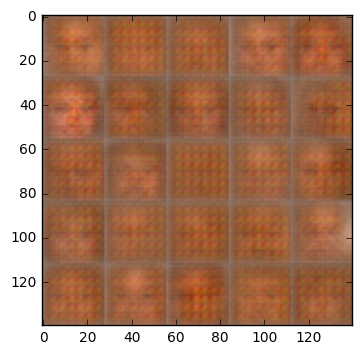

Epoch 1/1... Discriminator Loss: 1.5848... Generator Loss: 0.3506
Epoch 1/1... Discriminator Loss: 1.5669... Generator Loss: 0.3915
Epoch 1/1... Discriminator Loss: 1.5200... Generator Loss: 0.3127
Epoch 1/1... Discriminator Loss: 1.8629... Generator Loss: 0.2331
Epoch 1/1... Discriminator Loss: 2.0375... Generator Loss: 0.2191
Epoch 1/1... Discriminator Loss: 1.5371... Generator Loss: 0.4131
Epoch 1/1... Discriminator Loss: 1.5535... Generator Loss: 0.3588
Epoch 1/1... Discriminator Loss: 1.7694... Generator Loss: 0.2593
Epoch 1/1... Discriminator Loss: 1.9648... Generator Loss: 0.1981
Epoch 1/1... Discriminator Loss: 1.6160... Generator Loss: 0.3596


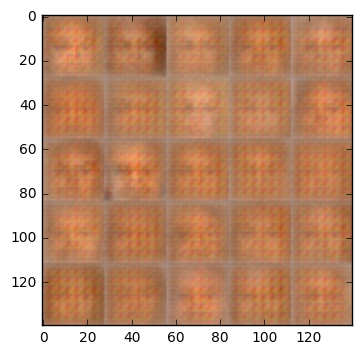

Epoch 1/1... Discriminator Loss: 1.7700... Generator Loss: 0.3028
Epoch 1/1... Discriminator Loss: 1.8998... Generator Loss: 0.2580
Epoch 1/1... Discriminator Loss: 1.7294... Generator Loss: 0.3121
Epoch 1/1... Discriminator Loss: 1.9309... Generator Loss: 0.2447
Epoch 1/1... Discriminator Loss: 1.7463... Generator Loss: 0.2975
Epoch 1/1... Discriminator Loss: 1.9169... Generator Loss: 0.2556
Epoch 1/1... Discriminator Loss: 2.1461... Generator Loss: 0.1651
Epoch 1/1... Discriminator Loss: 1.4744... Generator Loss: 0.4444
Epoch 1/1... Discriminator Loss: 1.6711... Generator Loss: 0.3007
Epoch 1/1... Discriminator Loss: 1.6501... Generator Loss: 0.3175


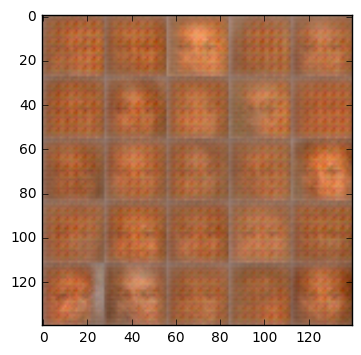

Epoch 1/1... Discriminator Loss: 1.8231... Generator Loss: 0.3240
Epoch 1/1... Discriminator Loss: 1.6098... Generator Loss: 0.7889
Epoch 1/1... Discriminator Loss: 1.3666... Generator Loss: 0.4610
Epoch 1/1... Discriminator Loss: 1.7735... Generator Loss: 0.2959
Epoch 1/1... Discriminator Loss: 1.9277... Generator Loss: 0.2300
Epoch 1/1... Discriminator Loss: 1.8714... Generator Loss: 0.2220
Epoch 1/1... Discriminator Loss: 1.6576... Generator Loss: 0.3372
Epoch 1/1... Discriminator Loss: 1.6476... Generator Loss: 0.2806
Epoch 1/1... Discriminator Loss: 1.3979... Generator Loss: 0.4548
Epoch 1/1... Discriminator Loss: 1.8814... Generator Loss: 0.2172


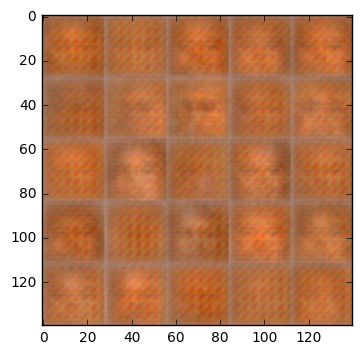

Epoch 1/1... Discriminator Loss: 1.9344... Generator Loss: 0.2160
Epoch 1/1... Discriminator Loss: 1.7049... Generator Loss: 0.2616
Epoch 1/1... Discriminator Loss: 2.0518... Generator Loss: 0.2139
Epoch 1/1... Discriminator Loss: 1.8013... Generator Loss: 0.2520
Epoch 1/1... Discriminator Loss: 2.1524... Generator Loss: 0.1554
Epoch 1/1... Discriminator Loss: 1.5078... Generator Loss: 0.3691
Epoch 1/1... Discriminator Loss: 1.8745... Generator Loss: 0.2340
Epoch 1/1... Discriminator Loss: 1.7712... Generator Loss: 0.2718
Epoch 1/1... Discriminator Loss: 1.6379... Generator Loss: 0.3707
Epoch 1/1... Discriminator Loss: 1.6618... Generator Loss: 0.3078


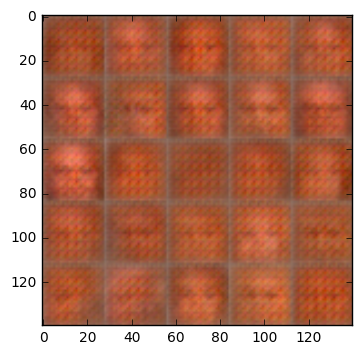

Epoch 1/1... Discriminator Loss: 2.3195... Generator Loss: 0.1796
Epoch 1/1... Discriminator Loss: 2.1024... Generator Loss: 0.3756
Epoch 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.4178
Epoch 1/1... Discriminator Loss: 1.8499... Generator Loss: 0.2438
Epoch 1/1... Discriminator Loss: 2.1119... Generator Loss: 0.1887
Epoch 1/1... Discriminator Loss: 1.6105... Generator Loss: 0.3198
Epoch 1/1... Discriminator Loss: 2.0566... Generator Loss: 0.1682
Epoch 1/1... Discriminator Loss: 1.8205... Generator Loss: 0.2801
Epoch 1/1... Discriminator Loss: 1.6693... Generator Loss: 0.2882
Epoch 1/1... Discriminator Loss: 2.0163... Generator Loss: 0.1918


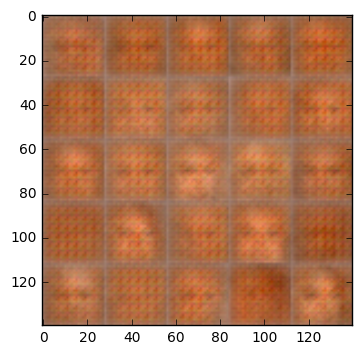

Epoch 1/1... Discriminator Loss: 1.5641... Generator Loss: 0.3618
Epoch 1/1... Discriminator Loss: 1.4713... Generator Loss: 0.4193
Epoch 1/1... Discriminator Loss: 1.5295... Generator Loss: 0.4373
Epoch 1/1... Discriminator Loss: 1.7877... Generator Loss: 0.2499
Epoch 1/1... Discriminator Loss: 1.6263... Generator Loss: 0.3425
Epoch 1/1... Discriminator Loss: 1.4867... Generator Loss: 0.4334
Epoch 1/1... Discriminator Loss: 1.3679... Generator Loss: 0.3852
Epoch 1/1... Discriminator Loss: 1.9485... Generator Loss: 0.2273
Epoch 1/1... Discriminator Loss: 1.5644... Generator Loss: 0.3687
Epoch 1/1... Discriminator Loss: 1.9895... Generator Loss: 0.1941


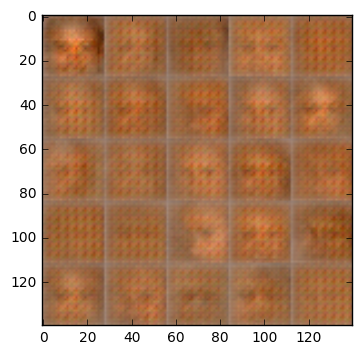

Epoch 1/1... Discriminator Loss: 1.5793... Generator Loss: 0.3788
Epoch 1/1... Discriminator Loss: 1.7970... Generator Loss: 0.2825
Epoch 1/1... Discriminator Loss: 1.5644... Generator Loss: 0.3364
Epoch 1/1... Discriminator Loss: 1.5975... Generator Loss: 0.3481
Epoch 1/1... Discriminator Loss: 1.8571... Generator Loss: 0.2284
Epoch 1/1... Discriminator Loss: 1.6978... Generator Loss: 0.2675
Epoch 1/1... Discriminator Loss: 2.1717... Generator Loss: 0.1521
Epoch 1/1... Discriminator Loss: 1.6742... Generator Loss: 0.3031
Epoch 1/1... Discriminator Loss: 1.9656... Generator Loss: 0.2156
Epoch 1/1... Discriminator Loss: 1.5780... Generator Loss: 0.3161


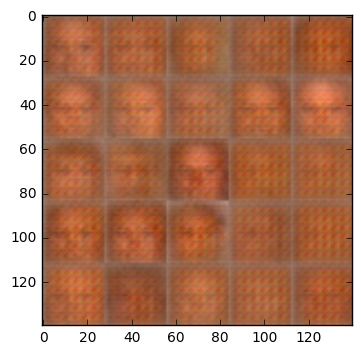

Epoch 1/1... Discriminator Loss: 1.8880... Generator Loss: 0.2168
Epoch 1/1... Discriminator Loss: 2.0719... Generator Loss: 0.1719
Epoch 1/1... Discriminator Loss: 1.6998... Generator Loss: 0.2923
Epoch 1/1... Discriminator Loss: 1.6379... Generator Loss: 0.4684
Epoch 1/1... Discriminator Loss: 1.7313... Generator Loss: 0.2875
Epoch 1/1... Discriminator Loss: 1.5597... Generator Loss: 0.3415
Epoch 1/1... Discriminator Loss: 1.8102... Generator Loss: 0.2434
Epoch 1/1... Discriminator Loss: 1.7168... Generator Loss: 0.2499
Epoch 1/1... Discriminator Loss: 1.3273... Generator Loss: 0.5187
Epoch 1/1... Discriminator Loss: 1.8764... Generator Loss: 0.2216


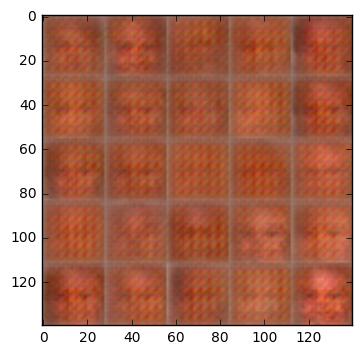

Epoch 1/1... Discriminator Loss: 2.1900... Generator Loss: 0.1590
Epoch 1/1... Discriminator Loss: 2.0226... Generator Loss: 0.1812
Epoch 1/1... Discriminator Loss: 1.7282... Generator Loss: 0.2669
Epoch 1/1... Discriminator Loss: 1.4901... Generator Loss: 0.4678
Epoch 1/1... Discriminator Loss: 1.4718... Generator Loss: 0.4382
Epoch 1/1... Discriminator Loss: 2.1495... Generator Loss: 0.1733
Epoch 1/1... Discriminator Loss: 1.8267... Generator Loss: 0.2447
Epoch 1/1... Discriminator Loss: 1.5528... Generator Loss: 0.3310
Epoch 1/1... Discriminator Loss: 1.7978... Generator Loss: 0.2412
Epoch 1/1... Discriminator Loss: 1.5464... Generator Loss: 0.4380


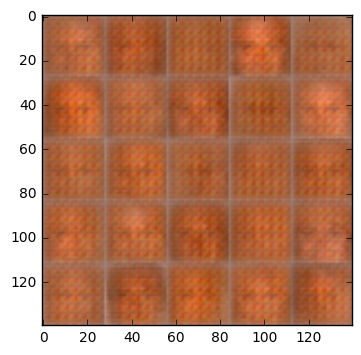

Epoch 1/1... Discriminator Loss: 1.9721... Generator Loss: 0.1900
Epoch 1/1... Discriminator Loss: 1.8788... Generator Loss: 0.2629
Epoch 1/1... Discriminator Loss: 1.4320... Generator Loss: 0.4392
Epoch 1/1... Discriminator Loss: 1.8865... Generator Loss: 0.2212
Epoch 1/1... Discriminator Loss: 1.6115... Generator Loss: 0.3318
Epoch 1/1... Discriminator Loss: 1.6965... Generator Loss: 0.3044
Epoch 1/1... Discriminator Loss: 1.4881... Generator Loss: 0.5277
Epoch 1/1... Discriminator Loss: 1.9695... Generator Loss: 0.2106
Epoch 1/1... Discriminator Loss: 1.6996... Generator Loss: 0.2695
Epoch 1/1... Discriminator Loss: 1.7904... Generator Loss: 0.2365


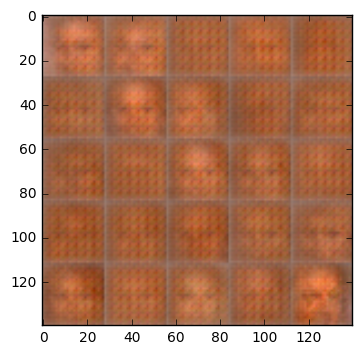

Epoch 1/1... Discriminator Loss: 1.6396... Generator Loss: 0.3978
Epoch 1/1... Discriminator Loss: 1.9558... Generator Loss: 0.2534
Epoch 1/1... Discriminator Loss: 1.6372... Generator Loss: 0.3183
Epoch 1/1... Discriminator Loss: 1.9477... Generator Loss: 0.2032
Epoch 1/1... Discriminator Loss: 2.0978... Generator Loss: 0.1926
Epoch 1/1... Discriminator Loss: 1.6432... Generator Loss: 0.3975
Epoch 1/1... Discriminator Loss: 2.0466... Generator Loss: 0.2636
Epoch 1/1... Discriminator Loss: 1.8721... Generator Loss: 0.2445
Epoch 1/1... Discriminator Loss: 1.9476... Generator Loss: 0.2042
Epoch 1/1... Discriminator Loss: 2.5761... Generator Loss: 0.0991


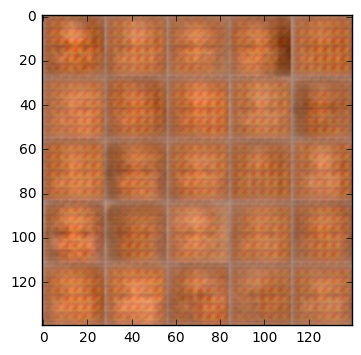

Epoch 1/1... Discriminator Loss: 1.8762... Generator Loss: 0.2099
Epoch 1/1... Discriminator Loss: 1.7658... Generator Loss: 0.2795
Epoch 1/1... Discriminator Loss: 1.9872... Generator Loss: 0.1884
Epoch 1/1... Discriminator Loss: 1.8858... Generator Loss: 0.3927
Epoch 1/1... Discriminator Loss: 1.3933... Generator Loss: 0.4528
Epoch 1/1... Discriminator Loss: 1.6630... Generator Loss: 0.3804
Epoch 1/1... Discriminator Loss: 2.0024... Generator Loss: 0.2035
Epoch 1/1... Discriminator Loss: 1.5640... Generator Loss: 0.3240
Epoch 1/1... Discriminator Loss: 1.8244... Generator Loss: 0.2519
Epoch 1/1... Discriminator Loss: 1.6596... Generator Loss: 0.4087


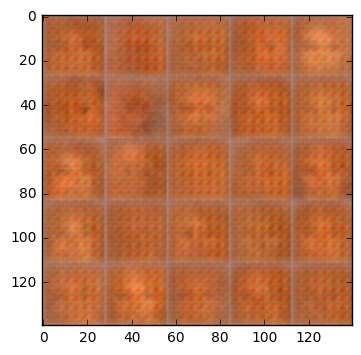

Epoch 1/1... Discriminator Loss: 2.1973... Generator Loss: 0.1585
Epoch 1/1... Discriminator Loss: 1.7729... Generator Loss: 0.3342
Epoch 1/1... Discriminator Loss: 1.8838... Generator Loss: 0.2382
Epoch 1/1... Discriminator Loss: 1.9143... Generator Loss: 0.3306
Epoch 1/1... Discriminator Loss: 1.6743... Generator Loss: 0.2789
Epoch 1/1... Discriminator Loss: 1.6613... Generator Loss: 0.2894
Epoch 1/1... Discriminator Loss: 1.9080... Generator Loss: 0.2104
Epoch 1/1... Discriminator Loss: 1.8878... Generator Loss: 0.2261
Epoch 1/1... Discriminator Loss: 1.8514... Generator Loss: 0.2959
Epoch 1/1... Discriminator Loss: 1.7367... Generator Loss: 0.2954


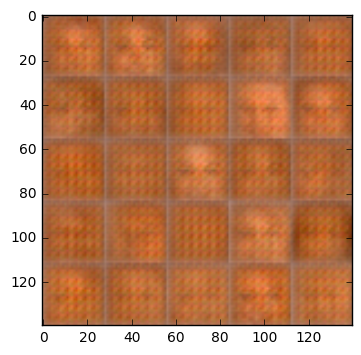

Epoch 1/1... Discriminator Loss: 2.0085... Generator Loss: 0.1792
Epoch 1/1... Discriminator Loss: 1.6297... Generator Loss: 0.3176
Epoch 1/1... Discriminator Loss: 2.1890... Generator Loss: 0.2062
Epoch 1/1... Discriminator Loss: 1.7405... Generator Loss: 0.2858
Epoch 1/1... Discriminator Loss: 1.5659... Generator Loss: 0.3550
Epoch 1/1... Discriminator Loss: 1.7583... Generator Loss: 0.2402
Epoch 1/1... Discriminator Loss: 2.2390... Generator Loss: 0.1656
Epoch 1/1... Discriminator Loss: 1.7322... Generator Loss: 0.2653
Epoch 1/1... Discriminator Loss: 1.9728... Generator Loss: 0.2104
Epoch 1/1... Discriminator Loss: 1.9176... Generator Loss: 0.2824


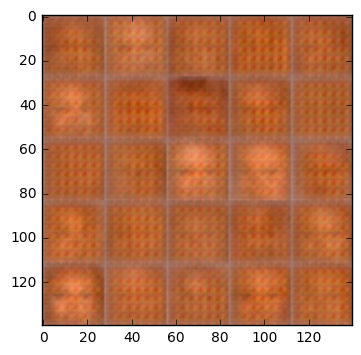

Epoch 1/1... Discriminator Loss: 1.4865... Generator Loss: 0.3441
Epoch 1/1... Discriminator Loss: 1.3305... Generator Loss: 0.5537
Epoch 1/1... Discriminator Loss: 1.5564... Generator Loss: 0.3271
Epoch 1/1... Discriminator Loss: 1.8743... Generator Loss: 0.2930
Epoch 1/1... Discriminator Loss: 1.6221... Generator Loss: 0.3039
Epoch 1/1... Discriminator Loss: 1.5617... Generator Loss: 0.3414
Epoch 1/1... Discriminator Loss: 1.2789... Generator Loss: 0.4338
Epoch 1/1... Discriminator Loss: 1.9698... Generator Loss: 0.1804
Epoch 1/1... Discriminator Loss: 1.8807... Generator Loss: 0.2407
Epoch 1/1... Discriminator Loss: 1.8444... Generator Loss: 0.2531


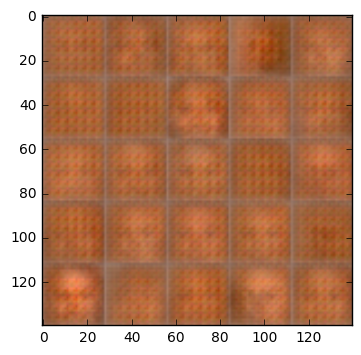

Epoch 1/1... Discriminator Loss: 1.9347... Generator Loss: 0.2136
Epoch 1/1... Discriminator Loss: 1.9548... Generator Loss: 0.2156
Epoch 1/1... Discriminator Loss: 1.9947... Generator Loss: 0.2089
Epoch 1/1... Discriminator Loss: 2.0035... Generator Loss: 0.1958
Epoch 1/1... Discriminator Loss: 1.9400... Generator Loss: 0.1956
Epoch 1/1... Discriminator Loss: 1.8930... Generator Loss: 0.2048
Epoch 1/1... Discriminator Loss: 1.5893... Generator Loss: 0.3215
Epoch 1/1... Discriminator Loss: 1.7878... Generator Loss: 0.2465
Epoch 1/1... Discriminator Loss: 1.8521... Generator Loss: 0.2684
Epoch 1/1... Discriminator Loss: 1.8473... Generator Loss: 0.3050


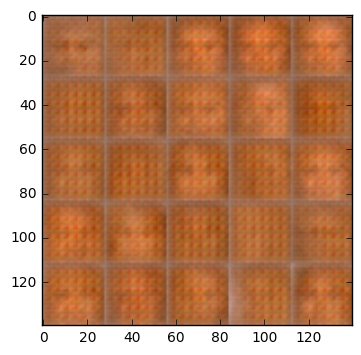

Epoch 1/1... Discriminator Loss: 1.7750... Generator Loss: 0.2608
Epoch 1/1... Discriminator Loss: 1.9594... Generator Loss: 0.1857
Epoch 1/1... Discriminator Loss: 1.9494... Generator Loss: 0.2160
Epoch 1/1... Discriminator Loss: 1.4633... Generator Loss: 0.4335
Epoch 1/1... Discriminator Loss: 2.3200... Generator Loss: 0.4115
Epoch 1/1... Discriminator Loss: 1.7678... Generator Loss: 0.2995
Epoch 1/1... Discriminator Loss: 1.7468... Generator Loss: 0.2351
Epoch 1/1... Discriminator Loss: 1.7638... Generator Loss: 0.2388
Epoch 1/1... Discriminator Loss: 2.1674... Generator Loss: 0.1539
Epoch 1/1... Discriminator Loss: 1.8422... Generator Loss: 0.2400


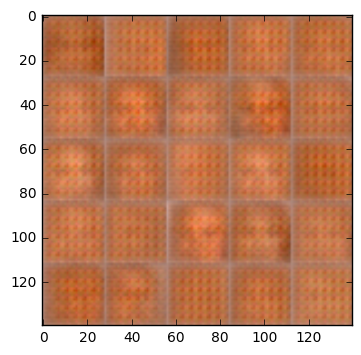

Epoch 1/1... Discriminator Loss: 1.9027... Generator Loss: 0.2493
Epoch 1/1... Discriminator Loss: 1.9477... Generator Loss: 0.2065
Epoch 1/1... Discriminator Loss: 1.7909... Generator Loss: 0.2736
Epoch 1/1... Discriminator Loss: 2.2642... Generator Loss: 0.1468
Epoch 1/1... Discriminator Loss: 2.3307... Generator Loss: 0.1315
Epoch 1/1... Discriminator Loss: 1.6988... Generator Loss: 0.2921
Epoch 1/1... Discriminator Loss: 1.8622... Generator Loss: 0.2119
Epoch 1/1... Discriminator Loss: 1.7955... Generator Loss: 0.2746
Epoch 1/1... Discriminator Loss: 1.9741... Generator Loss: 0.2141
Epoch 1/1... Discriminator Loss: 1.9087... Generator Loss: 0.5430


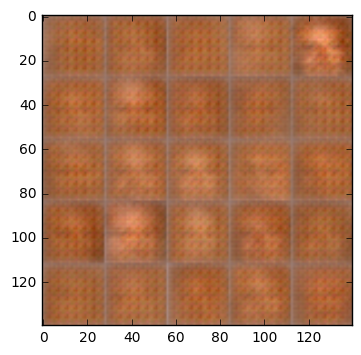

Epoch 1/1... Discriminator Loss: 2.0980... Generator Loss: 0.1672
Epoch 1/1... Discriminator Loss: 1.7556... Generator Loss: 0.2778
Epoch 1/1... Discriminator Loss: 1.5238... Generator Loss: 0.3846
Epoch 1/1... Discriminator Loss: 1.9457... Generator Loss: 0.2030
Epoch 1/1... Discriminator Loss: 1.8162... Generator Loss: 0.2348
Epoch 1/1... Discriminator Loss: 1.8940... Generator Loss: 0.2226
Epoch 1/1... Discriminator Loss: 1.4154... Generator Loss: 0.4275
Epoch 1/1... Discriminator Loss: 1.7447... Generator Loss: 0.2704
Epoch 1/1... Discriminator Loss: 1.8217... Generator Loss: 0.2134
Epoch 1/1... Discriminator Loss: 1.9589... Generator Loss: 0.2468


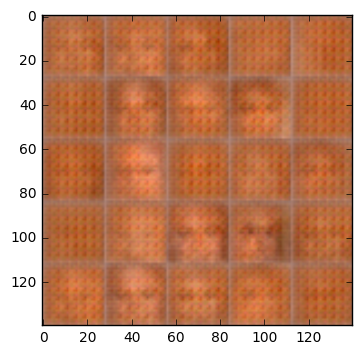

Epoch 1/1... Discriminator Loss: 1.4614... Generator Loss: 0.4455
Epoch 1/1... Discriminator Loss: 2.0419... Generator Loss: 0.2637
Epoch 1/1... Discriminator Loss: 2.0212... Generator Loss: 0.1873
Epoch 1/1... Discriminator Loss: 2.1978... Generator Loss: 0.1496


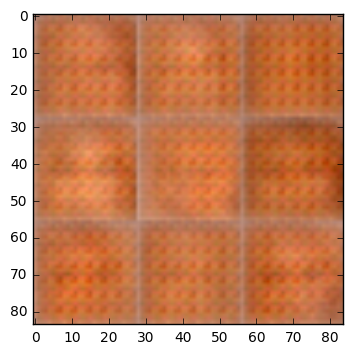

In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.3
alpha = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.